In [4]:
!pip install kagglehub 

### Downloading a Kaggle Dataset Using `kagglehub`

This code snippet demonstrates how to use the `kagglehub` library to download a dataset from Kaggle and save it to a specified local directory.

1. **Importing the Library**:
   - The `kagglehub` library is imported to facilitate the dataset download.

2. **Setting the Destination Path**:
   - The variable `destination_path` specifies the local directory where the dataset files will be saved. In this case, the destination is set to:
     ```
     C:\Users\Novel kathor\Desktop\Task_2\archive
     ```

3. **Downloading the Dataset**:
   - The `kagglehub.dataset_download` function is used to download the "Amazon Fine Food Reviews" dataset (identified by `snap/amazon-fine-food-reviews` on Kaggle) to the specified path.

4. **Output**:
   - The downloaded dataset's path is stored in the variable `path`.
   - The final print statement displays the location of the dataset files for confirmation.

#### Output Example:



In [ ]:
import kagglehub

# Define the destination path where you want to save the dataset
destination_path = r"C:\Users\Novel kathor\Desktop\Task_2\archive"

# Download the latest version of the dataset to the specified path
path = kagglehub.dataset_download("snap/amazon-fine-food-reviews", destination_path=destination_path)

print("Path to dataset files:", path)


### Creating a Test Subset of a Dataset for testing purposes 

This code creates a smaller subset of an existing dataset and saves it to a new file.

1. **Loading the Original Dataset**:
   - The dataset is loaded from `dataset/Reviews.csv`.

2. **Creating a Subset**:
   - The first 100,000 rows are extracted and stored in a new DataFrame.

3. **Saving the Subset**:
   - The subset is saved as a new CSV file: `dataset/Reviews_test_1L.csv`.

4. **Output**:
   - A confirmation message indicates the successful creation of the test copy.





### This is for only testing purposes main code use the entire dataset. ###



In [2]:
import pandas as pd

# Load the original dataset
df = pd.read_csv('dataset/Reviews.csv')

# Create a test copy with only the first 1000 rows
test_df = df.head(100000)

# Save the test copy to a new CSV file
test_df.to_csv('dataset/Reviews_test_1L.csv', index=False)

print("Test copy of the dataset with 100000 rows has been created.")


Test copy of the dataset with 100000 rows has been created.


### Preprocessing Text Data for Sentiment Analysis

This script preprocesses text data from a dataset using advanced Natural Language Processing (NLP) techniques. 

#### Key Features:

1. **Normalization**:
   - Removes special characters, URLs, and extra whitespace.
   - Converts text to lowercase.

2. **Negation Handling**:
   - Replaces specific negation phrases (e.g., "not good") with more meaningful terms (e.g., "bad").

3. **Text Preprocessing**:
   - **`Summary` Column**:
     - Processes text using `spaCy` for tokenization, stopword removal, and lemmatization.
   - **`Text` Column**:
     - Tokenizes text, removes stopwords, and applies lemmatization using `nltk`.

4. **Progress Monitoring**:
   - Displays progress bars for operations using `tqdm`.

5. **Output**:
   - The processed dataset is saved to a new CSV file (`filtered_data.csv`).
   - Adds two new columns:
     - `Cleaned_Summary`: Preprocessed summary text.
     - `Cleaned_Text`: Preprocessed main text.

#### Workflow:
1. **Load the Dataset**:
   - Reads the input dataset from `Reviews.csv`.
2. **Apply Normalization**:
   - Cleans all text columns in the dataset.
3. **Detailed Processing**:
   - Applies specialized preprocessing to `Summary` and `Text` columns.
4. **Save Results**:
   - Exports the processed dataset to a new file for further analysis.

#### Output Example:


In [4]:
import re
import pandas as pd
import spacy
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
import nltk
from tqdm import tqdm

# Download necessary NLTK data
nltk.download('punkt')
nltk.download('stopwords')
nltk.download('wordnet')

# Initialize tqdm for pandas
tqdm.pandas()

# Load spaCy model for NLP
nlp = spacy.load('en_core_web_sm')

# Initialize lemmatizer
lemmatizer = WordNetLemmatizer()

# Function to normalize and clean text (applies to all columns)
def normalize_text(text):
    """
    Normalize text by:
    1. Removing special characters, URLs, and excessive whitespace.
    2. Converting text to lowercase.
    """
    try:
        # Remove URLs
        text = re.sub(r'http\S+|www\S+|https\S+', '', str(text), flags=re.MULTILINE)
        # Remove special characters and extra whitespace
        text = re.sub(r'[^a-zA-Z0-9\s]', '', text).strip()
        # Convert to lowercase
        return text.lower()
    except Exception as e:
        print(f"Error normalizing text: {text} -> {e}")
        return ""

# Function to handle negation and clean the summary
def handle_negation_and_clean(summary):
    """
    This function handles specific negation phrases and transforms them into meaningful forms.
    """
    negation_patterns = {
        "not as advertised": "false advertisement",
        "not as expected": "unexpected",
        "not good": "bad",
        "not great": "bad",
        "not recommended": "unrecommended"
    }

    # Replace specific negation patterns with more meaningful text
    for pattern, replacement in negation_patterns.items():
        summary = summary.replace(pattern, replacement)

    return summary

# Function to preprocess the `Summary` column using spaCy
def preprocess_summary(text):
    """
    Use spaCy to analyze text in the `Summary` column, handle negation, and simplify it.
    Then tokenize, remove stop words, and apply lemmatization to text.
    """
    try:
        # Normalize the text (to lowercase, remove special characters, etc.)
        text = normalize_text(text)
        
        # Handle negation and clean the summary
        text = handle_negation_and_clean(text)

        # Process the text with spaCy
        doc = nlp(text)

        # List to hold processed tokens
        processed_tokens = []

        # For each token in the processed doc, add the lemmatized token
        for token in doc:
            # Add the lemmatized word if not punctuation or stopword
            if token.pos_ not in ['PUNCT', 'DET']:
                processed_tokens.append(token.lemma_)

        # Return cleaned and simplified text
        return ' '.join(processed_tokens)
    except Exception as e:
        print(f"Error processing summary text: {text} -> {e}")
        return ""

# Function to preprocess the `Text` column (tokenize, stopword removal, lemmatization)
def preprocess_text(text):
    """
    Tokenize, remove stop words, and apply lemmatization to text in the `Text` column.
    """
    try:
        # Tokenize text
        tokens = word_tokenize(text)
        # Remove stop words
        stop_words = set(stopwords.words('english'))
        tokens = [word for word in tokens if word not in stop_words]
        # Apply lemmatization
        tokens = [lemmatizer.lemmatize(word) for word in tokens]
        # Return processed text
        return ' '.join(tokens)
    except Exception as e:
        print(f"Error processing text: {text} -> {e}")
        return ""

# Main script
if __name__ == "__main__":
    # Input and output file paths
    input_file = "dataset/Reviews.csv"  # Updated file path
    output_file = "dataset/filtered_data.csv"

    try:
        # Load the dataset
        df = pd.read_csv(input_file)

        # Apply normalization to all columns (this won't show progress bar for each column)
        df[df.columns] = df[df.columns].progress_apply(lambda x: x.apply(normalize_text))

        # Apply detailed preprocessing to the `Summary` column with progress bar and spaCy
        if 'Summary' in df.columns:
            df['Cleaned_Summary'] = df['Summary'].progress_apply(preprocess_summary)

        # Apply tokenization, stopword removal, and lemmatization to the `Text` column
        if 'Text' in df.columns:
            df['Cleaned_Text'] = df['Text'].progress_apply(preprocess_text)

        # Save the processed dataset
        df.to_csv(output_file, index=False)

        print(f"Filtered data has been saved to {output_file}")
        print(df.head())  # Display the first few rows for confirmation

    except Exception as e:
        print(f"Error: {e}")


[nltk_data] Downloading package punkt to C:\Users\Novel
[nltk_data]     kathor\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to C:\Users\Novel
[nltk_data]     kathor\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to C:\Users\Novel
[nltk_data]     kathor\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
100%|████████████████████████████████████████████████████████████████████████| 568454/568454 [06:29<00:00, 1458.86it/s]


Filtered data has been saved to dataset/filtered_data.csv
  Id   ProductId          UserId                    ProfileName  \
0  1  b001e4kfg0  a3sgxh7auhu8gw                     delmartian   
1  2  b00813grg4  a1d87f6zcve5nk                         dll pa   
2  3  b000lqoch0   abxlmwjixxain  natalia corres natalia corres   
3  4  b000ua0qiq  a395borc6fgvxv                           karl   
4  5  b006k2zz7k  a1uqrsclf8gw1t      michael d bigham m wassir   

  HelpfulnessNumerator HelpfulnessDenominator Score        Time  \
0                    1                      1     5  1303862400   
1                    0                      0     1  1346976000   
2                    1                      1     4  1219017600   
3                    3                      3     2  1307923200   
4                    0                      0     5  1350777600   

                 Summary                                               Text  \
0  good quality dog food  i have bought several of the vi


#### Notes:
- Necessary NLTK resources are downloaded before processing.
- Uses `spaCy`'s `en_core_web_sm` model for NLP tasks.


### Sentiment Analysis of Text Data

This script performs sentiment analysis on preprocessed text data using two methods: **TextBlob** and **VADER (Valence Aware Dictionary and sEntiment Reasoner)**.

#### Key Features:

1. **Sentiment Analysis Methods**:
   - **TextBlob**:
     - Computes a polarity score ranging from `-1` (negative) to `1` (positive).
   - **VADER**:
     - Computes a compound sentiment score ranging from `-1` (negative) to `1` (positive), specifically designed for social media and short text sentiment analysis.

2. **Integration with Dataset**:
   - Adds two new columns to the dataset:
     - `Sentiment_TextBlob`: Sentiment scores calculated using TextBlob.
     - `Sentiment_VADER`: Sentiment scores calculated using VADER.

3. **Data Handling**:
   - Reads the cleaned text data from `filtered_data.csv`.
   - Processes each row's `Cleaned_Text` column for sentiment analysis.

4. **Output**:
   - Saves the updated dataset with sentiment scores to `Sentiment_Scores.csv`.
   - Displays the first few rows of the dataset, including sentiment scores.

#### Workflow:
1. **Load Dataset**:
   - Reads the input dataset from `filtered_data.csv`.
2. **Perform Sentiment Analysis**:
   - Computes sentiment scores for each row using both TextBlob and VADER.
3. **Save Results**:
   - Exports the dataset with sentiment scores to a new file for further analysis.

#### Output Example:


In [6]:
import pandas as pd
from textblob import TextBlob
from nltk.sentiment.vader import SentimentIntensityAnalyzer
from tqdm import tqdm
import nltk

# Download necessary resources for VADER
nltk.download("vader_lexicon")

# Initialize VADER Sentiment Analyzer
vader = SentimentIntensityAnalyzer()

# Define functions for sentiment analysis
def analyze_sentiment_textblob(text):
    """
    Analyze sentiment using TextBlob.
    Returns a polarity score between -1 (negative) and 1 (positive).
    """
    try:
        blob = TextBlob(text)
        return blob.sentiment.polarity
    except Exception as e:
        print(f"Error with TextBlob: {e}")
        return 0

def analyze_sentiment_vader(text):
    """
    Analyze sentiment using VADER.
    Returns the compound sentiment score, ranging from -1 to 1.
    """
    try:
        scores = vader.polarity_scores(text)
        return scores['compound']
    except Exception as e:
        print(f"Error with VADER: {e}")
        return 0

# Main function
if __name__ == "__main__":
    # Load the dataset
    input_file = "dataset/filtered_data.csv"  # Replace with your file path
    output_file = "dataset/Sentiment_Scores.csv"
    
    try:
        # Read the CSV file
        print("Loading dataset...")
        df = pd.read_csv(input_file)
        total_rows = len(df)
        
        print("Analyzing sentiments...")
        # Initialize empty lists to store sentiment scores
        textblob_scores = []
        vader_scores = []
        
        # Process each row with progress bar
        for text in tqdm(df['Cleaned_Text'], desc="Processing", unit="texts"):
            textblob_scores.append(analyze_sentiment_textblob(text))
            vader_scores.append(analyze_sentiment_vader(text))
        
        # Add scores to dataframe
        df['Sentiment_TextBlob'] = textblob_scores
        df['Sentiment_VADER'] = vader_scores
        
        # Save the updated dataset
        print("Saving results...")
        df.to_csv(output_file, index=False)
        print(f"Sentiment scores added successfully. Results saved to {output_file}")
        
        # Display a sample of the results
        print("\nSample results:")
        print(df[['Cleaned_Text', 'Sentiment_TextBlob', 'Sentiment_VADER']].head())
    
    except Exception as e:
        print(f"Error: {e}")

[nltk_data] Downloading package vader_lexicon to C:\Users\Novel
[nltk_data]     kathor\AppData\Roaming\nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


Loading dataset...
Analyzing sentiments...


Processing: 100%|█████████████████████████████████████████████████████████| 568454/568454 [07:19<00:00, 1294.75texts/s]


Saving results...
Sentiment scores added successfully. Results saved to dataset/Sentiment_Scores.csv

Sample results:
                                        Cleaned_Text  Sentiment_TextBlob  \
0  bought several vitality canned dog food produc...            0.425000   
1  product arrived labeled jumbo salted peanutsth...            0.216667   
2  confection around century light pillowy citrus...            0.187000   
3  looking secret ingredient robitussin believe f...            0.150000   
4  great taffy great price wide assortment yummy ...            0.458333   

   Sentiment_VADER  
0           0.9413  
1          -0.1027  
2           0.8624  
3           0.4404  
4           0.9468  


### Extracting Key Phrases Using spaCy

This script extracts **noun phrases** (key phrases) from preprocessed text data using the **spaCy** NLP library.

#### Key Features:
1. **Noun Phrase Extraction**:
   - Uses spaCy's `noun_chunks` to identify and extract meaningful noun phrases from the `Cleaned_Text` column of the dataset.

2. **Progress Tracking**:
   - Integrates `tqdm` to provide a progress bar for visualizing the processing of rows in the dataset.

3. **Dataset Integration**:
   - Adds a new column, `Key_Phrases`, to the dataset. This column contains a list of noun phrases extracted from the corresponding `Cleaned_Text`.

4. **Output**:
   - Saves the updated dataset, including the `Key_Phrases` column, to `output_with_key_phrases.csv`.

#### Workflow:
1. **Load Dataset**:
   - Reads the dataset from `Sentiment_Scores.csv`, which contains preprocessed text and sentiment scores.
2. **Process Text Data**:
   - Applies the `extract_phrases` function to each row in the `Cleaned_Text` column, leveraging spaCy's language model.
3. **Save Results**:
   - Writes the modified dataset with the new `Key_Phrases` column to a CSV file.

#### Output Example:
- The `Key_Phrases` column will contain a list of noun phrases, such as:


In [6]:
import spacy
import pandas as pd
from tqdm import tqdm  # Import tqdm for the progress bar

# Load spaCy model
nlp = spacy.load("en_core_web_sm")

# Function to extract noun phrases
def extract_phrases(text):
    doc = nlp(text)
    return [chunk.text for chunk in doc.noun_chunks]

# Load your dataset
df = pd.read_csv("dataset/Sentiment_Scores.csv")

# Add a progress bar while applying the function to the 'Cleaned_Text' column
tqdm.pandas(desc="Extracting Key Phrases")  # Add a description to the progress bar
df['Key_Phrases'] = df['Cleaned_Text'].progress_apply(extract_phrases)  # Use progress_apply to show progress

# Optionally, save the result to a new CSV file
df.to_csv("dataset/output_with_key_phrases.csv", index=False)


Extracting Key Phrases: 100%|███| 568454/568454 [1:15:01<00:00, 126.28it/s]


## Feature Processing and Feature Engineering Pipeline

### Overview

This function processes a large dataset by reading it in chunks, extracting and transforming both numerical and text features, scaling them, and then combining them into a final dataset. The process involves:
1. **Numerical Feature Transformation**: Adding a new feature `Helpfulness_Ratio` and scaling existing numerical features.
2. **Text Feature Extraction**: Using `TfidfVectorizer` to extract features from text data, followed by scaling the text features.
3. **Chunking**: Processing the data in chunks to avoid memory issues with large datasets.
4. **Scaling**: Numerical and text features are scaled separately to ensure that all features are on a comparable scale.

### Key Steps in the Function:
- **Reading Data**: The dataset is read in chunks using `pandas.read_csv` to manage memory efficiently.
- **Feature Engineering**: 
  - A new feature `Helpfulness_Ratio` is derived by dividing `HelpfulnessNumerator` by `HelpfulnessDenominator`.
  - Text data is processed using `TfidfVectorizer` to extract a fixed number of features (`max_features`).
- **Scaling**: 
  - Numerical features are scaled using `StandardScaler`.
  - Text features are scaled while preserving the sparsity (non-zero entries).
- **Chunking for Text Features**: Text features are processed and stored in chunks to handle memory and performance issues when dealing with large datasets.
  
### Steps in Detail:
1. **Numerical Features**:
   - Calculate the `Helpfulness_Ratio` for each entry by dividing `HelpfulnessNumerator` by `HelpfulnessDenominator`.
   - All numerical features are then scaled using `StandardScaler`.
  
2. **Text Features**:
   - The `TfidfVectorizer` is applied to the `Cleaned_Text` column to convert text data into numerical features.
   - Features are extracted in chunks and stored as a sparse matrix.
   - These text features are then scaled using `StandardScaler`, preserving zero values to maintain sparsity.

3. **Final Dataset**:
   - After processing and scaling both numerical and text features, they are combined into a final dataset that contains both sets of features.
   - This dataset is then saved to a CSV file for further use.

### Example Usage:
- **Input**: A CSV file containing numerical and textual data.
- **Output**: A CSV file with processed and scaled features for modeling or further analysis.

### Data Verification:
- The code verifies the number of rows and features after processing.
- It also checks the distribution of numerical features and ensures they are properly scaled (mean = 0, std = 1).
- It calculates and prints the sparsity of the text features, ensuring that the final dataset is sparse and efficient for modeling.

### Example Output:
- A CSV file (`processed_features_final_v4.csv`) containing the processed and scaled dataset.


In [12]:
import pandas as pd
import numpy as np
from scipy import sparse
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.preprocessing import StandardScaler
from tqdm import tqdm

def process_features_final(file_path, max_features=100, chunk_size=10000):
    """
    Process features with document-specific text feature preservation using chunking
    """
    print("Reading and processing data in chunks...")
    numerical_cols = ['Score', 'HelpfulnessNumerator', 'HelpfulnessDenominator',
                      'Sentiment_TextBlob', 'Sentiment_VADER']

    # Initialize TfidfVectorizer
    tfidf = TfidfVectorizer(
        max_features=max_features,
        stop_words='english',
        min_df=2,
        max_df=0.95,
        norm='l2',
        smooth_idf=True,
        sublinear_tf=True,
        use_idf=True
    )

    # Initialize lists to store processed chunks
    processed_chunks = []
    text_chunks = []

    # Process data in chunks
    total_rows = 0
    for chunk in tqdm(pd.read_csv(file_path, usecols=numerical_cols + ['Cleaned_Text'], chunksize=chunk_size)):
        total_rows += len(chunk)
        # Process numerical features
        chunk['Helpfulness_Ratio'] = chunk['HelpfulnessNumerator'] / chunk['HelpfulnessDenominator'].replace(0, 1)
        numerical_features = chunk[numerical_cols + ['Helpfulness_Ratio']]

        # Store text for later processing
        text_chunks.append(chunk['Cleaned_Text'].fillna(''))

        # Store numerical features
        processed_chunks.append(numerical_features)

    print(f"Total rows processed: {total_rows}")

    # Combine all chunks with a reset index to ensure uniqueness
    final_df = pd.concat(processed_chunks, axis=0, ignore_index=True)
    all_text = pd.concat(text_chunks, axis=0, ignore_index=True)

    # Fit TfidfVectorizer on all text data
    print("Processing text features...")
    text_matrix = tfidf.fit_transform(all_text)
    feature_names = [f'text_feature_{i}' for i in range(text_matrix.shape[1])]

    # Process text features in chunks
    text_features_list = []
    for i in tqdm(range(0, len(all_text), chunk_size)):
        chunk_text_matrix = text_matrix[i:i+chunk_size]
        chunk_text_features = pd.DataFrame(
            chunk_text_matrix.toarray(),
            columns=feature_names
        )
        text_features_list.append(chunk_text_features)

    text_features = pd.concat(text_features_list, axis=0, ignore_index=True)

    # Scale numerical features
    print("Scaling numerical features...")
    scaler = StandardScaler()
    final_df_scaled = pd.DataFrame(
        scaler.fit_transform(final_df),
        columns=numerical_cols + ['Helpfulness_Ratio']
    )

    # Scale text features while preserving zeros
    print("Scaling text features...")
    text_features_scaled = text_features.copy()
    non_zero_mask = text_features != 0

    for column in tqdm(text_features.columns):
        non_zero_values = text_features[column][non_zero_mask[column]]
        if len(non_zero_values) > 0:
            scaler = StandardScaler()
            scaled_values = scaler.fit_transform(non_zero_values.values.reshape(-1, 1))
            text_features_scaled.loc[non_zero_mask[column], column] = scaled_values.ravel()

    # Combine features
    final_features = pd.concat([final_df_scaled, text_features_scaled], axis=1)

    return final_features, final_df

# Example usage
if __name__ == "__main__":
    file_path = "dataset/processed_dataset.csv"
    final_features, original_numerical = process_features_final(file_path)

    # Verify total number of rows
    print(f"\nTotal number of rows in the final dataset: {len(final_features)}")

    # Verify total number of features
    total_features = len(final_features.columns)
    expected_features = 6 + 100  # 5 numerical + 1 derived + 100 text features
    print(f"\nTotal number of features: {total_features}")
    print(f"Expected number of features: {expected_features}")
    assert total_features == expected_features, "Mismatch in number of features"

    # Check distribution of numerical features
    print("\nDistribution of numerical features:")
    numerical_cols = ['Score', 'HelpfulnessNumerator', 'HelpfulnessDenominator',
                      'Sentiment_TextBlob', 'Sentiment_VADER', 'Helpfulness_Ratio']
    print(final_features[numerical_cols].describe())

    # Verify scaling of numerical features
    print("\nVerifying scaling of numerical features:")
    for col in numerical_cols:
        mean = final_features[col].mean()
        std = final_features[col].std()
        print(f"{col}: Mean = {mean:.6f}, Std = {std:.6f}")

        # Check if the scaling is within an acceptable range
        if abs(mean) > 1e-6 or abs(std - 1) > 1e-6:
            print(f"Warning: Scaling for {col} is not exact. This may be due to floating-point precision.")
            print(f"Original {col} - Min: {original_numerical[col].min()}, Max: {original_numerical[col].max()}")

    # Check distribution of text features
    print("\nDistribution of text features:")
    text_cols = [col for col in final_features.columns if col.startswith('text_feature_')]
    print(final_features[text_cols].describe())

    # Verify sparsity of text features
    non_zero_counts = (final_features[text_cols] != 0).sum()
    sparsity = 1 - (non_zero_counts.sum() / (len(final_features) * len(text_cols)))
    print(f"\nSparsity of text features: {sparsity:.4f}")

    # Save processed features
    print("\nSaving processed features...")
    final_features.to_csv("dataset/processed_features_final_v4.csv", index=False)

    print("\nProcessing and verification complete.")



Reading and processing data in chunks...


57it [00:05, 11.29it/s]


Total rows processed: 568454
Processing text features...


100%|█████████████████████████████████████████████████████████████████████████████████| 57/57 [00:00<00:00, 407.03it/s]


Scaling numerical features...
Scaling text features...


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:01<00:00, 52.59it/s]



Total number of rows in the final dataset: 568454

Total number of features: 106
Expected number of features: 106

Distribution of numerical features:
              Score  HelpfulnessNumerator  HelpfulnessDenominator  \
count  5.684540e+05          5.684540e+05            5.684540e+05   
mean   3.782368e-16          1.014965e-17            1.257456e-17   
std    1.000001e+00          1.000001e+00            1.000001e+00   
min   -2.429116e+00         -2.283528e-01           -2.688639e-01   
25%   -1.397999e-01         -2.283528e-01           -2.688639e-01   
50%    6.233056e-01         -2.283528e-01           -1.482328e-01   
75%    6.233056e-01          3.354709e-02           -2.760162e-02   
max    6.233056e-01          1.131743e+02            1.110737e+02   

       Sentiment_TextBlob  Sentiment_VADER  Helpfulness_Ratio  
count        5.684540e+05     5.684540e+05       5.684540e+05  
mean        -1.414951e-16     1.885434e-16       6.045289e-16  
std          1.000001e+00     1.00

# Text Topic and Theme Extraction Using T5 Model

This script performs topic and theme extraction from text using a T5 transformer model. Below is an overview of its functionality:

## Memory Monitoring
- **`MemoryMonitor` Class**: Monitors GPU and RAM usage, ensuring efficient memory management during processing. Provides details like used, total, and free memory.

## Custom Dataset
- **`TextDataset` Class**: 
  - Custom dataset for processing text samples.
  - Generates two prompts for each text:
    - **Topic Prompt**: Extracts the main topic of the text in one word.
    - **Theme Prompt**: Identifies the primary theme of the text in one word.
  - Utilizes tokenizer for efficient encoding with truncation and padding.

## Topic and Theme Extraction
- **`TopicThemeExtractor` Class**:
  - Loads the T5 model (`google/flan-t5-base`) and tokenizer.
  - Supports GPU acceleration with FP16 precision for faster inference.
  - Processes batches of text and generates topics and themes using the model.
  - Logs memory status periodically and clears GPU cache when needed.

## Batch Processing
- **`batch_extract` Method**:
  - Processes texts in batches using a `DataLoader`.
  - Extracts topics and themes for each text and decodes model outputs.
  - Handles large datasets efficiently with periodic logging and memory cleanup.

## CSV Processing
- **`process_csv` Function**:
  - Reads a CSV file containing text data.
  - Identifies unprocessed rows (based on empty 'Topic' or 'Theme' columns).
  - Processes unprocessed rows in batches and updates the CSV file incrementally.
  - Saves progress periodically to prevent data loss.

## Entry Point
- **`main` Function**:
  - Specifies the input CSV file path.
  - Calls `process_csv` to process the file with predefined batch size and save intervals.

## Key Features
- Efficient memory management for handling large datasets.
- Support for GPU acceleration with automatic device selection.
- Incremental saving to ensure data persistence in case of interruptions.
- Customizable batch size and save intervals.

**Usage**:
Run the script with an input CSV file containing a 'Text' column. The output file will have 'Topic' and 'Theme' columns populated with extracted information.


In [ ]:
from transformers import AutoTokenizer, T5ForConditionalGeneration
import torch
import logging
import pandas as pd
from tqdm import tqdm
from torch.utils.data import Dataset, DataLoader
import os
import gc
import psutil
import GPUtil

class MemoryMonitor:
    @staticmethod
    def get_gpu_memory_info():
        try:
            gpu = GPUtil.getGPUs()[0]
            return {
                'gpu_memory_used': gpu.memoryUsed,
                'gpu_memory_total': gpu.memoryTotal,
                'gpu_memory_free': gpu.memoryFree
            }
        except Exception:
            return None

    @staticmethod
    def get_ram_info():
        ram = psutil.virtual_memory()
        return {
            'ram_used': ram.used / (1024 ** 3),  # GB
            'ram_total': ram.total / (1024 ** 3),  # GB
            'ram_free': ram.available / (1024 ** 3)  # GB
        }

class TextDataset(Dataset):
    def __init__(self, texts, indices, tokenizer, max_length=512):
        self.texts = texts
        self.indices = indices
        self.tokenizer = tokenizer
        self.max_length = max_length

    def __len__(self):
        return len(self.texts)

    def __getitem__(self, idx):
        text = str(self.texts[idx])
        topic_prompt = f"Task: Extract the main topic in one word from this text.\nText: {text}\nInstructions: Provide a single word that best describes what this text is about.\nTopic:"
        theme_prompt = f"Task: Extract the main theme in one word from this text.\nText: {text}\nInstructions: What is the Key theme of the given text in one word.\nThemes:"

        # Process both prompts in a single tokenization call
        encoded = {
            'topic_input': self.tokenizer(topic_prompt,
                                        return_tensors="pt",
                                        max_length=self.max_length,
                                        truncation=True,
                                        padding='max_length'),
            'theme_input': self.tokenizer(theme_prompt,
                                        return_tensors="pt",
                                        max_length=self.max_length,
                                        truncation=True,
                                        padding='max_length'),
            'index': self.indices[idx]
        }

        return encoded

class TopicThemeExtractor:
    def __init__(self, model_name="google/flan-t5-base", device=None):
        try:
            self.device = device if device else ('cuda' if torch.cuda.is_available() else 'cpu')
            self.tokenizer = AutoTokenizer.from_pretrained(model_name)
            self.model = T5ForConditionalGeneration.from_pretrained(model_name).to(self.device)

            # Optimize model for inference
            if self.device == 'cuda':
                self.model.half()  # Use FP16
                torch.cuda.empty_cache()
            self.model.eval()

            # Enable memory efficient attention if available
            if hasattr(self.model.config, 'use_cache'):
                self.model.config.use_cache = True

            # Log memory status
            self._log_memory_status("Model loaded")

        except Exception as e:
            logging.error(f"Error loading model: {str(e)}")
            raise

    def _log_memory_status(self, step=""):
        gpu_info = MemoryMonitor.get_gpu_memory_info()
        ram_info = MemoryMonitor.get_ram_info()

        logging.info(f"\nMemory Status - {step}")
        if gpu_info:
            logging.info(f"GPU Memory: Used={gpu_info['gpu_memory_used']:.1f}MB, Free={gpu_info['gpu_memory_free']:.1f}MB")
        logging.info(f"RAM: Used={ram_info['ram_used']:.1f}GB, Free={ram_info['ram_free']:.1f}GB")

    @torch.no_grad()
    def batch_extract(self, texts, indices, batch_size=128, max_length=50):
        dataset = TextDataset(texts, indices, self.tokenizer)
        dataloader = DataLoader(dataset,
                              batch_size=batch_size,
                              num_workers=4,
                              pin_memory=True)  # Enable pin memory for faster GPU transfer

        results = []
        total_batches = len(dataloader)

        for batch_idx, batch in enumerate(tqdm(dataloader, desc="Processing batches")):
            # Move batch to GPU efficiently
            topic_input_ids = batch['topic_input']['input_ids'].squeeze(1).to(self.device, non_blocking=True)
            topic_attention_mask = batch['topic_input']['attention_mask'].squeeze(1).to(self.device, non_blocking=True)
            theme_input_ids = batch['theme_input']['input_ids'].squeeze(1).to(self.device, non_blocking=True)
            theme_attention_mask = batch['theme_input']['attention_mask'].squeeze(1).to(self.device, non_blocking=True)

            # Generate topics and themes
            topic_outputs = self.model.generate(
                topic_input_ids,
                attention_mask=topic_attention_mask,
                max_length=max_length,
                num_return_sequences=1,
                temperature=0.7,
                do_sample=False  # Disable sampling for faster inference
            )

            theme_outputs = self.model.generate(
                theme_input_ids,
                attention_mask=theme_attention_mask,
                max_length=max_length,
                num_return_sequences=1,
                temperature=0.7,
                do_sample=False
            )

            # Decode outputs
            topics = [self.tokenizer.decode(output, skip_special_tokens=True)
                     for output in topic_outputs]
            themes = [self.tokenizer.decode(output, skip_special_tokens=True)
                     for output in theme_outputs]

            # Store results
            batch_indices = batch['index'].tolist()
            for idx, topic, theme in zip(batch_indices, topics, themes):
                results.append({'index': idx, 'topic': topic, 'theme': theme})

            # Memory management
            if (batch_idx + 1) % 10 == 0:  # Log every 10 batches
                self._log_memory_status(f"Batch {batch_idx + 1}/{total_batches}")
                if self.device == 'cuda':
                    torch.cuda.empty_cache()
                    gc.collect()

        return results

def process_csv(file_path, batch_size=128, save_interval=1000):
    try:
        logging.basicConfig(level=logging.INFO)
        logging.info(f"Starting processing of {file_path}")

        # Initialize the extractor
        extractor = TopicThemeExtractor()

        # Read the CSV file
        df = pd.read_csv(file_path)

        if 'Text' not in df.columns:
            raise ValueError("CSV file must contain a 'Text' column")

        # Check which rows need processing
        df['Topic'] = df.get('Topic', '')
        df['Theme'] = df.get('Theme', '')
        mask_to_process = (df['Topic'].isna()) | (df['Topic'] == '')

        if not mask_to_process.any():
            logging.info("All rows already processed!")
            return

        # Get unprocessed texts and their indices
        texts_to_process = df.loc[mask_to_process, 'Text'].fillna('')
        indices_to_process = texts_to_process.index

        logging.info(f"Processing {len(texts_to_process)} unprocessed rows...")

        # Process in batches and save incrementally
        results = extractor.batch_extract(texts_to_process, indices_to_process, batch_size=batch_size)

        # Update DataFrame with results
        for i, result in enumerate(results):
            idx = result['index']
            df.loc[idx, 'Topic'] = result['topic']
            df.loc[idx, 'Theme'] = result['theme']

            # Save periodically
            if (i + 1) % save_interval == 0:
                df.to_csv(file_path, index=False)
                logging.info(f"Progress saved at row {i + 1}/{len(results)}")

        # Final save
        df.to_csv(file_path, index=False)
        logging.info("Processing complete!")

    except Exception as e:
        logging.error(f"Error processing CSV: {str(e)}")
        if 'df' in locals():
            df.to_csv(file_path, index=False)
            logging.info("Progress saved after error")
        raise

def main():
    file_path = "dataset/output_with_key_phrases.csv"

    try:
        process_csv(file_path, batch_size=16, save_interval=1000)
    except Exception as e:
        logging.error(f"Error in main: {str(e)}")

if __name__ == "__main__":
    main()

In [1]:
import pandas as pd

# Path to the dataset
file_path = 'dataset/processed_dataset.csv'

# Read the dataset
df = pd.read_csv(file_path)

# Print the first 5 rows
print(df.head())


   Id   ProductId          UserId                    ProfileName  \
0   1  b001e4kfg0  a3sgxh7auhu8gw                     delmartian   
1   2  b00813grg4  a1d87f6zcve5nk                         dll pa   
2   3  b000lqoch0   abxlmwjixxain  natalia corres natalia corres   
3   4  b000ua0qiq  a395borc6fgvxv                           karl   
4   5  b006k2zz7k  a1uqrsclf8gw1t      michael d bigham m wassir   

   HelpfulnessNumerator  HelpfulnessDenominator  Score        Time  \
0                     1                       1      5  1303862400   
1                     0                       0      1  1346976000   
2                     1                       1      4  1219017600   
3                     3                       3      2  1307923200   
4                     0                       0      5  1350777600   

                 Summary                                               Text  \
0  good quality dog food  i have bought several of the vitality canned d...   
1      not a

## Description of Libraries:
- plotly: A graphing library that allows for interactive visualizations.
- gputil: A utility for querying GPU status and memory usage.
- matplotlib: A plotting library for creating static, interactive, and animated
visualizations.
- seaborn: A statistical data visualization library based on matplotlib, providing higher-level interfaces.

In [1]:
!pip install plotly gputil matplotlib seaborn tqdm

   ---------------------------------------- 0.0/19.1 MB ? eta -:--:--
   ---------------------------------------- 0.0/19.1 MB ? eta -:--:--
   ---------------------------------------- 0.0/19.1 MB ? eta -:--:--
    --------------------------------------- 0.3/19.1 MB ? eta -:--:--
    --------------------------------------- 0.3/19.1 MB ? eta -:--:--
   - -------------------------------------- 0.5/19.1 MB 621.2 kB/s eta 0:00:30
   - -------------------------------------- 0.5/19.1 MB 621.2 kB/s eta 0:00:30
   - -------------------------------------- 0.8/19.1 MB 633.2 kB/s eta 0:00:29
   - -------------------------------------- 0.8/19.1 MB 633.2 kB/s eta 0:00:29
   - -------------------------------------- 0.8/19.1 MB 633.2 kB/s eta 0:00:29
   - -------------------------------------- 0.8/19.1 MB 633.2 kB/s eta 0:00:29
   - -------------------------------------- 0.8/19.1 MB 633.2 kB/s eta 0:00:29
   - -------------------------------------- 0.8/19.1 MB 633.2 kB/s eta 0:00:29
   - -------------



This code performs an analysis of scores based on various dimensions (`Theme`, `Topic`, and `Key_Phrases`) from a dataset and visualizes the results using scatter plots.

1. **Data Aggregation**:
   - The `create_aggregated_scatter` function aggregates data by a specified dimension (e.g., `Theme`) using different statistical methods such as mean, median, max, and weighted mean.
   - The function calculates the mean, median, max score, and weighted mean score for each group, ensuring only those groups with a sufficient number of reviews (`min_count`) are included.

2. **Visualization**:
   - The aggregated results are visualized using a scatter plot where:
     - The x-axis represents the different groups (e.g., `Theme`).
     - The y-axis shows the chosen aggregation method (default is mean).
     - The size of the scatter plot points corresponds to the number of reviews for each group.

3. **Analysis of Multiple Dimensions**:
   - The `analyze_all_dimensions` function evaluates the dataset by `Theme`, `Topic`, and `Key_Phrases`. It displays the top categories by review count and generates a scatter plot for each dimension, helping to identify trends in the data.

The code offers a comprehensive approach to analyzing and visualizing score distributions across various dimensions in the dataset.


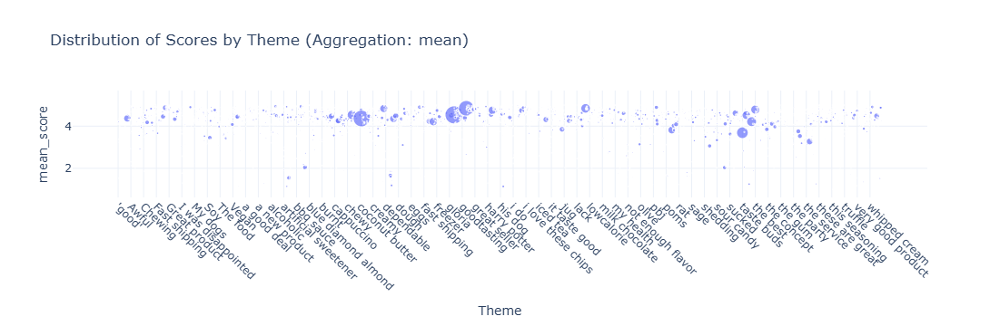


Analyzing by Theme

Top Themes by review count:
Theme
good         14276
coffee       11988
great        10671
taste         5856
the           4442
chocolate     3910
love          3857
the best      3843
tea           3112
food          3095
healthy       3033
delicious     2842
price         2709
dog           2585
Amazon        2376
sweet         1987
the taste     1979
candy         1745
cat food      1591
Great         1589
dtype: int64


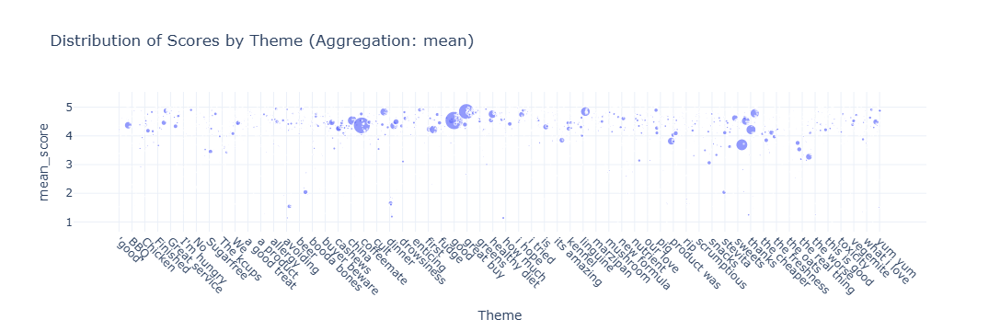


Analyzing by Topic

Top Topics by review count:
Topic
coffee          11575
Coffee           7124
Good             6731
good             5349
great            3990
Unknown          3917
tea              2837
Great            2360
cat food         2079
chocolate        1996
Amazon           1957
Great coffee     1681
Tea              1666
jerky            1552
Dog food         1389
Food             1334
amazon           1273
Dog              1251
food             1244
Taste            1204
dtype: int64


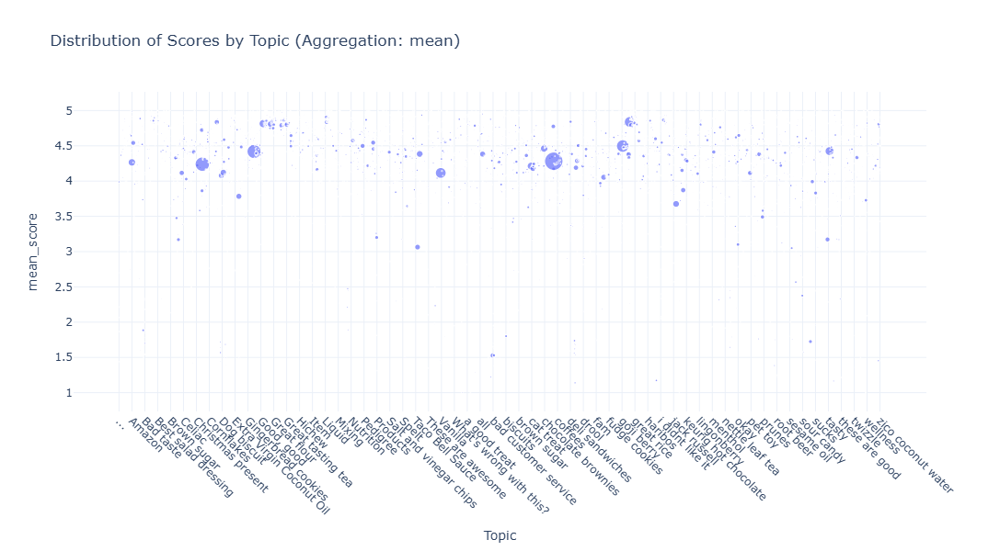


Analyzing by Key_Phrases

Top Key_Phrasess by review count:
Key_Phrases
[]                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                             

In [2]:

import pandas as pd
import plotly.express as px
import plotly.graph_objects as go
import numpy as np

df = pd.read_csv('dataset/processed_dataset.csv')

def create_aggregated_scatter(df, group_by_column, score_column, agg_method='mean', min_count=10):
    agg_data = df.groupby(group_by_column).agg({
        score_column: [
            'mean',
            'median',
            'max',
            'count',
            lambda x: np.average(x, weights=df.loc[x.index, 'count'] if 'count' in df else None)
        ]
    }).reset_index()

    agg_data.columns = [group_by_column, 'mean_score', 'median_score',
                       'max_score', 'review_count', 'weighted_mean']

    agg_data = agg_data[agg_data['review_count'] >= min_count]

    score_map = {
        'mean': 'mean_score',
        'median': 'median_score',
        'max': 'max_score',
        'weighted_mean': 'weighted_mean'
    }

    score_column = score_map.get(agg_method, 'mean_score')

    fig = px.scatter(
        agg_data,
        x=group_by_column,
        y=score_column,
        size='review_count',
        hover_data=['review_count', 'mean_score', 'median_score', 'max_score'],
        title=f'Distribution of Scores by {group_by_column} (Aggregation: {agg_method})',
        height=600
    )

    fig.update_layout(
        xaxis_tickangle=45,
        showlegend=True,
        template='plotly_white',
        margin=dict(b=100)
    )

    return fig

def analyze_all_dimensions(df, score_column='Score', min_count=10):
    dimensions = ['Theme', 'Topic', 'Key_Phrases']
    methods = ['mean', 'weighted_mean', 'median', 'max']

    for dim in dimensions:
        print(f"\nAnalyzing by {dim}")
        top_categories = df.groupby(dim).size().sort_values(ascending=False).head(20)
        print(f"\nTop {dim}s by review count:")
        print(top_categories)

        fig = create_aggregated_scatter(
            df,
            group_by_column=dim,
            score_column=score_column,
            agg_method='mean',
            min_count=min_count
        )
        fig.show()

theme_plot = create_aggregated_scatter(
    df,
    group_by_column='Theme',
    score_column='Score'
)
theme_plot.show()

analyze_all_dimensions(df)

## Topic Plotly

### Overview
This script processes a dataset containing topics and their associated scores to generate an interactive scatter plot visualization using **Plotly Express**. The visualization provides insights into topic distribution and associated scores, filtered by review count.

### Key Functions
1. **`create_topic_scatter(df, min_count=10, max_display=100)`**
   - Aggregates data by `Topic` to calculate statistical metrics (`mean`, `median`, `max`, and `count`) for the `Score` column.
   - Filters topics with at least `min_count` reviews and limits the display to the top `max_display` topics based on review count.
   - Creates an interactive scatter plot where:
     - The x-axis represents the topics.
     - The y-axis shows the mean score.
     - The bubble size corresponds to the review count.
     - The bubble color represents the mean score (using a Viridis color scale).
     - Hover information includes detailed statistics for each topic.

2. **`main()`**
   - Loads the processed dataset (`processed_dataset.csv`).
   - Prints an overview of the dataset, including total reviews, unique topics, and score range.
   - Calls `create_topic_scatter()` to generate and display the scatter plot.
   - Prints a summary of the top 10 topics based on review count, along with their statistical metrics (mean, median, and max scores).

### Visual Output
The scatter plot visualizes the distribution of scores by topic, highlighting the most reviewed topics with detailed metrics for easy interpretation.

### Application
This code is useful for analyzing topic-based datasets, allowing users to identify trends, compare topics, and gain insights into the relationship between topics and review scores.


Loading data...

Topic Analysis Overview:
Total reviews: 568,454
Unique topics: 203,195
Score range: 1.0 to 5.0

Creating Topic visualization...

Top 10 Topics by Review Count:
    Topic  review_count  mean_score  median_score  max_score
   coffee         11575        4.28          5.00          5
   Coffee          7124        4.24          5.00          5
     Good          6731        4.42          5.00          5
     good          5349        4.50          5.00          5
    great          3990        4.84          5.00          5
  Unknown          3917        4.12          5.00          5
      tea          2837        4.43          5.00          5
    Great          2360        4.82          5.00          5
 cat food          2079        4.21          5.00          5
chocolate          1996        4.46          5.00          5


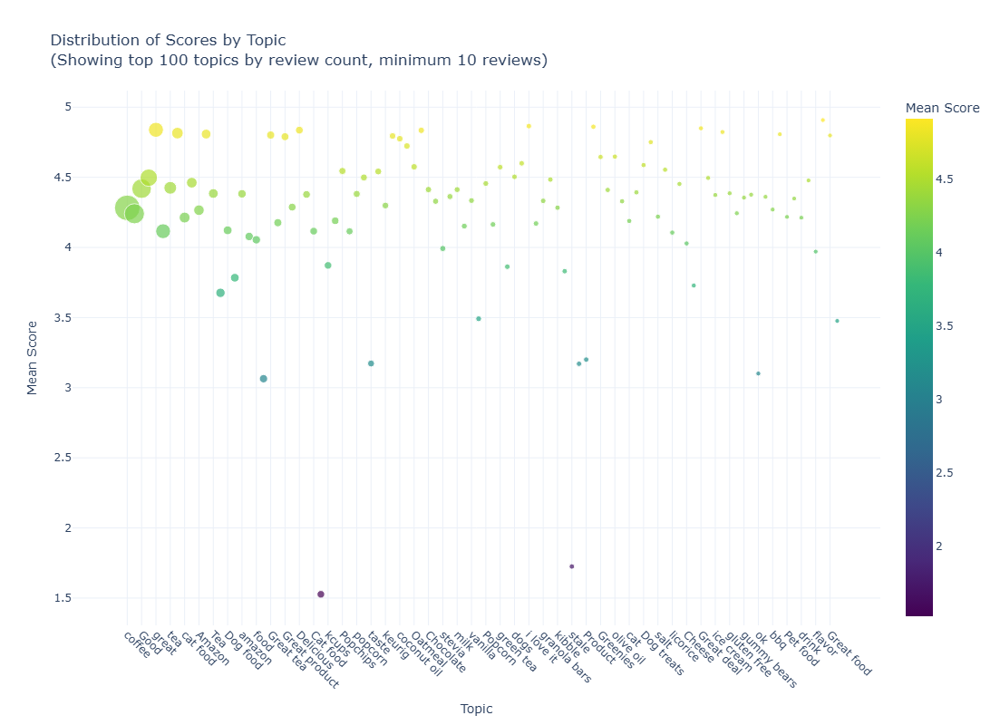

In [6]:
import pandas as pd
import plotly.express as px
import numpy as np

def create_topic_scatter(df, min_count=10, max_display=100):
    # Perform aggregation for topics
    topic_data = df.groupby('Topic').agg({
        'Score': [
            'mean',
            'median',
            'max',
            'count'
        ]
    }).reset_index()
    
    # Clean up column names
    topic_data.columns = ['Topic', 'mean_score', 'median_score', 'max_score', 'review_count']
    
    # Filter and sort
    topic_data = topic_data[topic_data['review_count'] >= min_count]
    topic_data = topic_data.sort_values('review_count', ascending=False).head(max_display)
    
    # Create figure
    fig = px.scatter(
        topic_data,
        x='Topic',
        y='mean_score',
        size='review_count',
        color='mean_score',
        color_continuous_scale='Viridis',
        hover_data={
            'Topic': True,
            'mean_score': ':.2f',
            'review_count': True,
            'median_score': ':.2f',
            'max_score': ':.2f'
        },
        labels={
            'Topic': 'Topic',
            'mean_score': 'Mean Score',
            'review_count': 'Review Count',
            'median_score': 'Median Score',
            'max_score': 'Max Score'
        }
    )
    
    # Update layout
    fig.update_layout(
        title=f'Distribution of Scores by Topic<br>(Showing top {max_display} topics by review count, minimum {min_count} reviews)',
        height=800,
        template='plotly_white',
        xaxis_tickangle=45,
        margin=dict(b=100, t=100)
    )
    
    return fig, topic_data

def main():
    # Load data
    print("Loading data...")
    df = pd.read_csv('dataset/processed_dataset.csv')
    
    # Print dataset overview
    print("\nTopic Analysis Overview:")
    print(f"Total reviews: {len(df):,}")
    print(f"Unique topics: {df['Topic'].nunique():,}")
    print(f"Score range: {df['Score'].min():.1f} to {df['Score'].max():.1f}")
    
    # Create visualization
    print("\nCreating Topic visualization...")
    fig, topic_stats = create_topic_scatter(df, min_count=10, max_display=100)
    
    # Print top topics statistics
    print("\nTop 10 Topics by Review Count:")
    print(topic_stats[['Topic', 'review_count', 'mean_score', 'median_score', 'max_score']]
          .head(10)
          .to_string(index=False, float_format=lambda x: '{:.2f}'.format(x) if isinstance(x, float) else str(x)))
    
    # Show the visualization
    fig.show()

if __name__ == "__main__":
    main()

## Theme Plotly

### Overview
This script processes a dataset containing themes, topics, and scores to create aggregated scatter plots and analyze multiple dimensions. The script utilizes **Plotly** for visualization and provides flexibility to group and aggregate data based on user-defined criteria.

### Key Functions

1. **`create_aggregated_scatter()`**
   - Groups the dataset by a specified column (e.g., `Theme`, `Topic`) and aggregates scores using methods such as `mean`, `median`, or `max`.
   - Filters groups with at least `min_count` reviews and sorts the results by review count.
   - Generates an interactive scatter plot where:
     - X-axis represents the group-by column (e.g., `Theme`).
     - Y-axis displays the aggregated score.
     - Bubble size indicates the review count.
     - Bubble color represents the aggregated score.
     - Hover tooltips show detailed statistics.

2. **`analyze_all_dimensions()`**
   - Analyzes multiple dimensions (e.g., `Theme`, `Topic`, `Key_Phrases`) by computing summary statistics (`count`, `mean`, `median`, `std`) for the specified score column.
   - Displays the top 10 groups for each dimension based on review count.
   - Calls `create_aggregated_scatter()` for each dimension to create visualizations.

3. **`main()`**
   - Loads the dataset from a specified file path.
   - Prints dataset metadata, including the number of rows, unique themes/topics, and the score range.
   - Creates a scatter plot visualization for the `Theme` dimension.
   - Calls `analyze_all_dimensions()` to analyze all specified dimensions (`Theme`, `Topic`, `Key_Phrases`).

### Visual Outputs
- **Theme Visualization:** A scatter plot showing aggregated scores for themes, with bubble size and color indicating review count and score, respectively.
- **Dimension Analysis:** Scatter plots for additional dimensions (e.g., `Topic`, `Key_Phrases`), with summary statistics printed for the top 10 groups.

### Application
This script is ideal for analyzing datasets with categorical groupings (e.g., themes or topics) and numerical scores. It allows for quick identification of key groups and insights into score distribution and review counts across dimensions.


Loading data...

Dataset Overview:
Total rows: 568,454
Unique Themes: 194,531
Unique Topics: 203,195
Score range: 1.0 to 5.0

Creating Theme visualization...


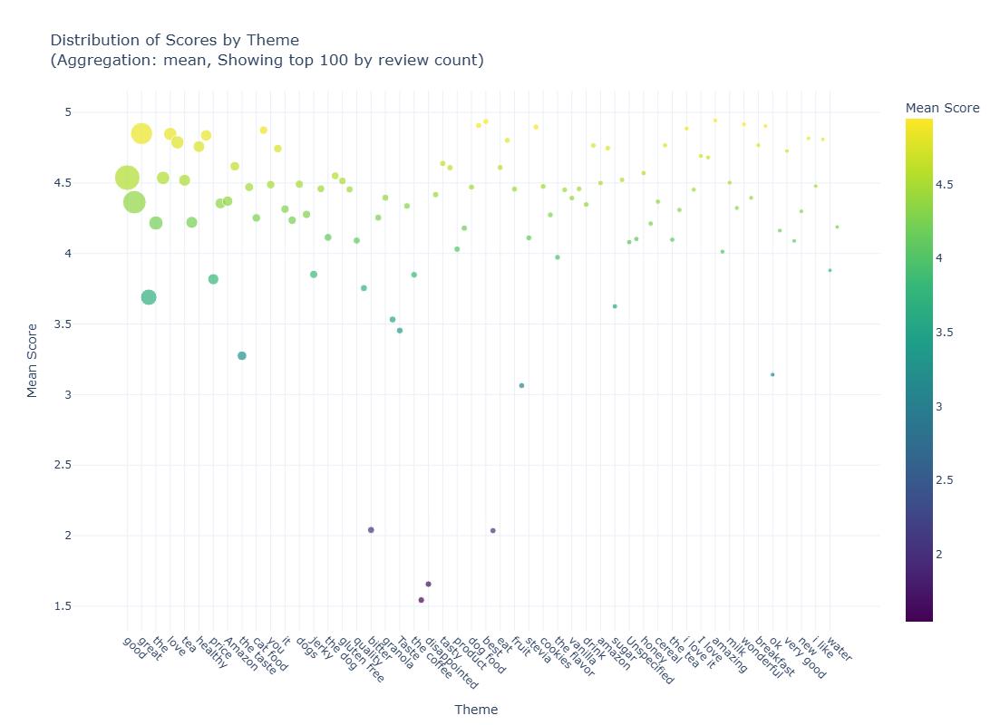


Analyzing all dimensions...

Analyzing Theme

Top 10 Themes by review count:
            Theme  count      mean  median       std
71479        good  14276  4.537616     5.0  0.786613
59198      coffee  11988  4.363530     5.0  1.025077
72942       great  10671  4.850155     5.0  0.442092
147222      taste   5856  3.689720     4.0  1.474128
148554        the   4442  4.216119     5.0  1.253909
58094   chocolate   3910  4.535550     5.0  0.970604
122982       love   3857  4.847031     5.0  0.527695
149762   the best   3843  4.787666     5.0  0.676584
147843        tea   3112  4.518959     5.0  0.981815
68733        food   3095  4.220679     5.0  1.283916


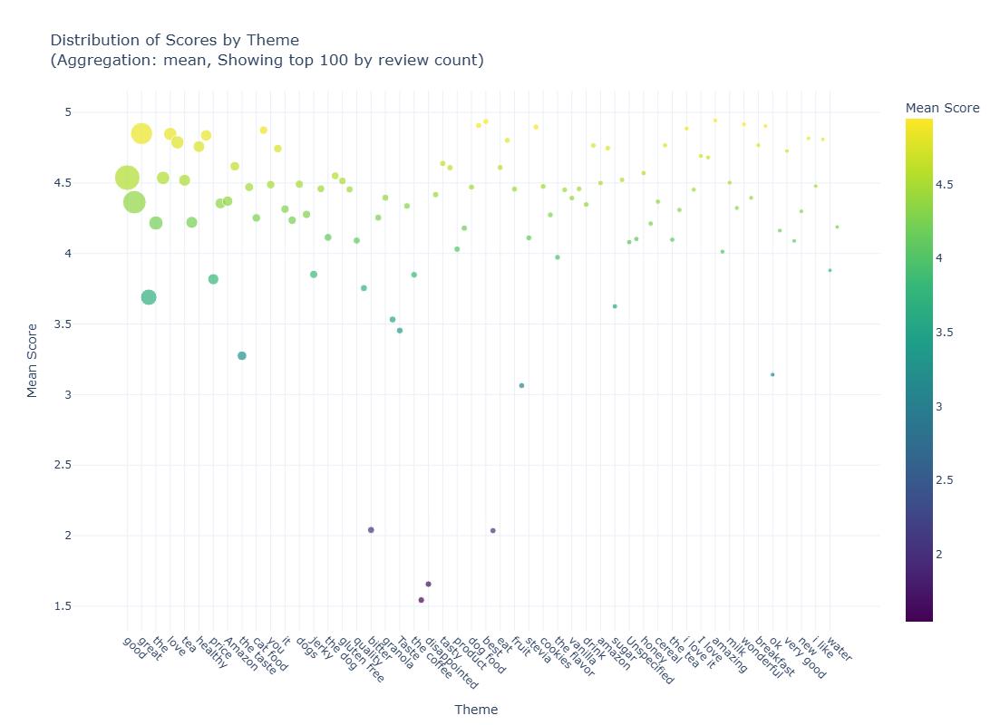


Analyzing Topic

Top 10 Topics by review count:
            Topic  count      mean  median       std
120737     coffee  11575  4.282333     5.0  1.114312
24493      Coffee   7124  4.240314     5.0  1.152221
35852        Good   6731  4.419403     5.0  0.910483
133171       good   5349  4.497476     5.0  0.790418
134271      great   3990  4.838847     5.0  0.443153
91174     Unknown   3917  4.115905     5.0  1.341506
187368        tea   2837  4.425097     5.0  1.075980
37236       Great   2360  4.815254     5.0  0.479972
116804   cat food   2079  4.213083     5.0  1.273216
119051  chocolate   1996  4.461924     5.0  1.083970


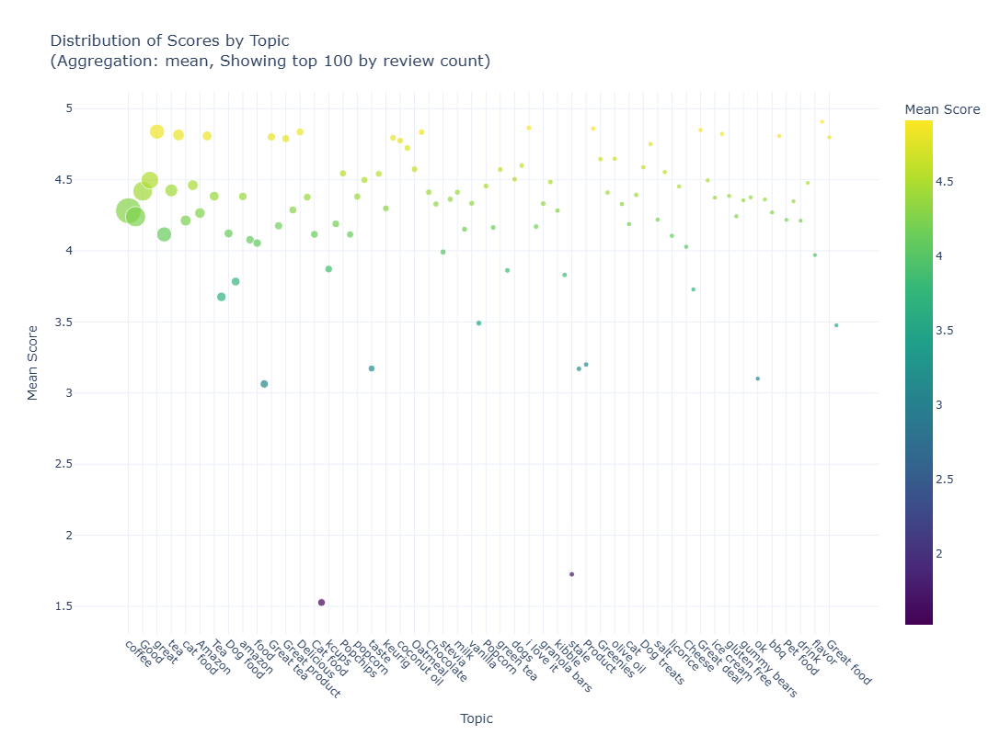


Analyzing Key_Phrases

Top 10 Key_Phrasess by review count:
                                              Key_Phrases  count      mean  \
391034                                                 []   1036  4.137066   
296872                                        ['product']    208  3.889423   
311566  ['review', 'sound', 'whatever', 'long people',...    199  1.000000   
83073   ['diamond almondsbr almond good source magnesi...    126  5.000000   
188672                                              ['i']    117  4.162393   
120449                                         ['flavor']     63  3.888889   
367332  ['two cat', 'one 6 one 2 year old indoor cat',...     51  5.000000   
67180                                          ['coffee']     50  4.680000   
194956                                           ['item']     49  4.102041   
354468                                            ['tea']     47  4.702128   

        median       std  
391034     5.0  1.334252  
296872     5.0  1.579544  

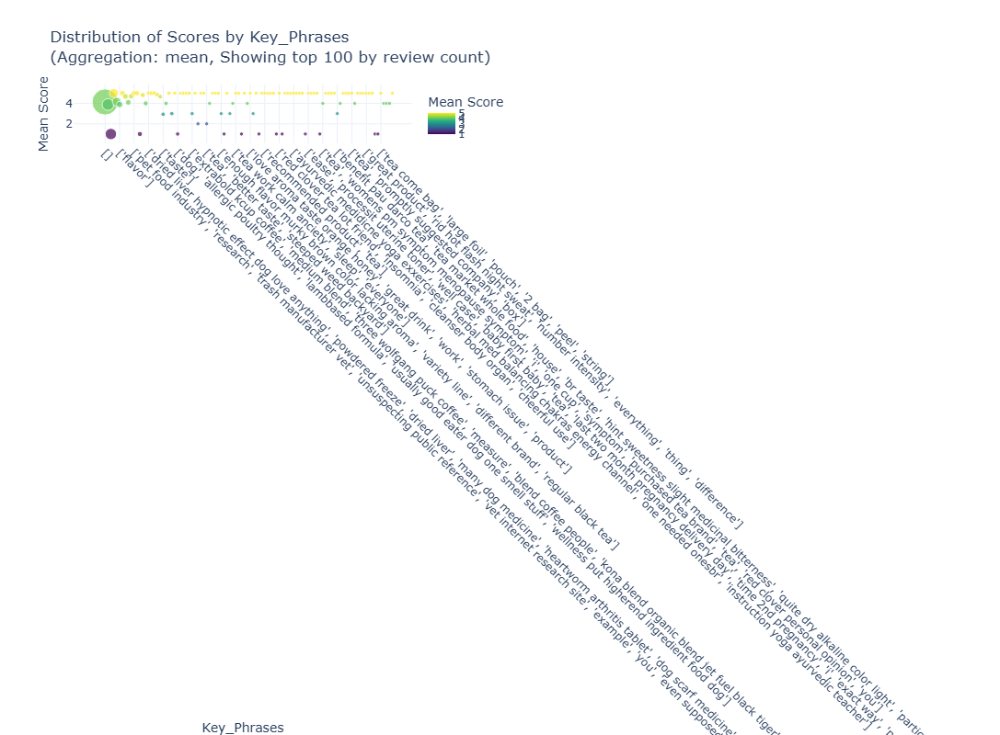

In [5]:
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go
import numpy as np

def create_aggregated_scatter(df, group_by_column, score_column, agg_method='mean', min_count=10, max_display=100):
    # Perform aggregation
    agg_data = df.groupby(group_by_column).agg({
        score_column: [
            'mean',
            'median',
            'max',
            'count'
        ]
    }).reset_index()
    
    # Clean up column names
    agg_data.columns = [group_by_column, 'mean_score', 'median_score', 'max_score', 'review_count']
    
    # Filter and sort
    agg_data = agg_data[agg_data['review_count'] >= min_count]
    agg_data = agg_data.sort_values('review_count', ascending=False).head(max_display)
    
    # Map aggregation method to column
    score_map = {
        'mean': 'mean_score',
        'median': 'median_score',
        'max': 'max_score'
    }
    score_column = score_map.get(agg_method, 'mean_score')
    
    # Create figure
    fig = px.scatter(
        agg_data,
        x=group_by_column,
        y=score_column,
        size='review_count',
        color=score_column,
        color_continuous_scale='Viridis',
        hover_data={
            group_by_column: True,
            score_column: ':.2f',
            'review_count': True,
            'mean_score': ':.2f',
            'median_score': ':.2f',
            'max_score': ':.2f'
        },
        labels={
            group_by_column: group_by_column,
            score_column: f'Score ({agg_method})',
            'review_count': 'Review Count',
            'mean_score': 'Mean Score',
            'median_score': 'Median Score',
            'max_score': 'Max Score'
        }
    )
    
    # Update layout
    fig.update_layout(
        title=f'Distribution of Scores by {group_by_column}<br>(Aggregation: {agg_method}, Showing top {max_display} by review count)',
        height=800,
        template='plotly_white',
        xaxis_tickangle=45,
        margin=dict(b=100, t=100)
    )
    
    return fig

def analyze_all_dimensions(df, dimensions=['Theme', 'Topic', 'Key_Phrases'], score_column='Score', 
                         min_count=10, max_display=100):
    for dim in dimensions:
        print(f"\nAnalyzing {dim}")
        
        # Get summary statistics
        stats = df.groupby(dim).agg({
            score_column: ['count', 'mean', 'median', 'std'],
        }).reset_index()
        stats.columns = [dim, 'count', 'mean', 'median', 'std']
        stats = stats.sort_values('count', ascending=False)
        
        print(f"\nTop 10 {dim}s by review count:")
        print(stats.head(10))
        
        # Create visualization
        fig = create_aggregated_scatter(
            df,
            group_by_column=dim,
            score_column=score_column,
            min_count=min_count,
            max_display=max_display
        )
        fig.show()

def main(filepath, min_count=10, max_display=100):
    print("Loading data...")
    df = pd.read_csv(filepath)
    
    print("\nDataset Overview:")
    print(f"Total rows: {len(df):,}")
    print(f"Unique Themes: {df['Theme'].nunique():,}")
    print(f"Unique Topics: {df['Topic'].nunique():,}")
    print(f"Score range: {df['Score'].min():.1f} to {df['Score'].max():.1f}")
    
    print("\nCreating Theme visualization...")
    theme_plot = create_aggregated_scatter(
        df,
        group_by_column='Theme',
        score_column='Score',
        max_display=max_display
    )
    theme_plot.show()
    
    print("\nAnalyzing all dimensions...")
    analyze_all_dimensions(df, min_count=min_count, max_display=max_display)

if __name__ == "__main__":
    main('dataset/processed_dataset.csv', min_count=10, max_display=100)

## Key Phrase Analysis and Visualization

### Overview
This script performs key phrase analysis on a dataset and visualizes the results using an interactive scatter plot. The focus is on statistical summaries of scores associated with key phrases, including mean, median, confidence intervals, and occurrence counts. 

### Key Functions
1. **`process_key_phrases`**:
   - Converts a string representation of a list in the `Key_Phrases` column to actual Python lists using `literal_eval`.
   - Explodes the dataframe to create one row per key phrase.

2. **`create_key_phrase_analysis`**:
   - Aggregates statistical metrics (e.g., mean, median, standard deviation) for key phrases.
   - Filters phrases with a minimum occurrence count (`min_count`) and limits the display to `max_display` phrases.
   - Computes 95% confidence intervals for the mean score.
   - Generates an interactive scatter plot using Plotly, where:
     - **X-axis**: Key phrases.
     - **Y-axis**: Mean score.
     - **Bubble size**: Number of reviews for each phrase.
     - **Bubble color**: Mean score, displayed with a continuous color scale.

3. **`main`**:
   - Loads a pre-processed dataset (`processed_dataset.csv`).
   - Prints a high-level summary of the dataset and key phrase statistics.
   - Calls `create_key_phrase_analysis` to generate the plot and displays the top key phrases by occurrence count.

### Key Features of the Visualization
- Interactive scatter plot with hover details showing statistics for each phrase.
- Confidence interval error bars for the mean score.
- Sorted display of top key phrases with high review counts.

### Data Flow
1. Load data from a CSV file.
2. Process the `Key_Phrases` column to explode key phrases into individual rows.
3. Calculate aggregated metrics for each key phrase.
4. Filter, sort, and visualize the results in an interactive Plotly scatter plot.

### Error Handling
- Handles file not found errors for the dataset.
- Provides a traceback for unexpected errors during execution.

### Example Output
- A scatter plot of scores for the top key phrases.
- A summary of the top 10 key phrases by review count, displaying their statistical metrics.

### Requirements
- `plotly.express` for visualization.
- `ast.literal_eval` to safely parse string representations of lists.
- CSV dataset with columns like `Key_Phrases` and `Score`.


Loading data...

Key Phrase Analysis Overview:
Total reviews: 568,454

Creating Key Phrase visualization...

Top 10 Key Phrases by Occurrence Count:
Key_Phrases  review_count  mean_score  median_score  max_score  min_score  std_score
          i        157791        4.15          5.00          5          1       1.29
        you         34927        4.20          5.00          5          1       1.19
    product         27595        3.76          5.00          5          1       1.52
  something         25553        3.80          4.00          5          1       1.44
       they         24952        4.26          5.00          5          1       1.17
       that         21683        3.98          5.00          5          1       1.33
     amazon         18706        4.22          5.00          5          1       1.36
   anything         15656        3.94          5.00          5          1       1.48
     flavor         13221        4.09          5.00          5          1       1.25
 

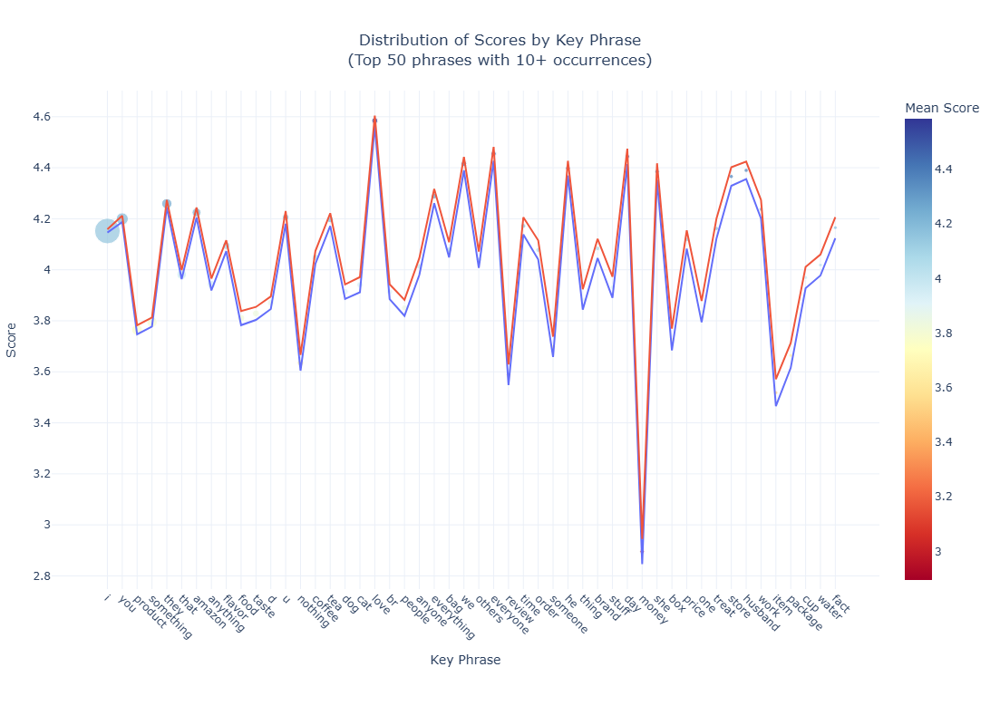

In [9]:
import pandas as pd
import plotly.express as px
import numpy as np
from ast import literal_eval
from typing import Tuple

def process_key_phrases(df: pd.DataFrame, key_phrase_col: str = 'Key_Phrases') -> pd.DataFrame:
    """
    Process the Key_Phrases column from string representation of list to actual lists
    and explode the dataframe to create one row per key phrase.
    """
    df = df.copy()
    df[key_phrase_col] = df[key_phrase_col].apply(literal_eval)
    return df.explode(key_phrase_col)

def create_key_phrase_analysis(
    df: pd.DataFrame,
    min_count: int = 10,
    max_display: int = 50,
    score_column: str = 'Score',
    key_phrase_col: str = 'Key_Phrases'
) -> Tuple[px.scatter, pd.DataFrame]:
    """
    Creates an interactive scatter plot visualization of key phrase scores and statistics.
    """
    # Process and explode key phrases
    df_exploded = process_key_phrases(df, key_phrase_col)
    
    # Calculate basic statistics
    phrase_data = df_exploded.groupby(key_phrase_col)[score_column].agg([
        ('mean_score', 'mean'),
        ('median_score', 'median'),
        ('max_score', 'max'),
        ('min_score', 'min'),
        ('review_count', 'count'),
        ('std_score', 'std')
    ]).reset_index()
    
    # Calculate confidence intervals
    phrase_data['ci_lower'] = phrase_data['mean_score'] - 1.96 * (phrase_data['std_score'] / np.sqrt(phrase_data['review_count']))
    phrase_data['ci_upper'] = phrase_data['mean_score'] + 1.96 * (phrase_data['std_score'] / np.sqrt(phrase_data['review_count']))
    
    # Filter and sort
    phrase_data = phrase_data[phrase_data['review_count'] >= min_count]
    phrase_data = phrase_data.sort_values('review_count', ascending=False).head(max_display)
    
    # Create figure
    fig = px.scatter(
        phrase_data,
        x=key_phrase_col,
        y='mean_score',
        size='review_count',
        color='mean_score',
        color_continuous_scale='RdYlBu',
        hover_data={
            key_phrase_col: True,
            'mean_score': ':.2f',
            'review_count': True,
            'median_score': ':.2f',
            'max_score': ':.2f',
            'min_score': ':.2f',
            'std_score': ':.2f',
            'ci_lower': ':.2f',
            'ci_upper': ':.2f'
        },
        labels={
            key_phrase_col: 'Key Phrase',
            'mean_score': 'Mean Score',
            'review_count': 'Number of Reviews',
            'median_score': 'Median Score',
            'max_score': 'Maximum Score',
            'min_score': 'Minimum Score',
            'std_score': 'Standard Deviation',
            'ci_lower': '95% CI Lower',
            'ci_upper': '95% CI Upper'
        }
    )
    
    # Add error bars for confidence intervals
    fig.add_traces(px.line(
        phrase_data,
        x=key_phrase_col,
        y=['ci_lower', 'ci_upper'],
        error_y=None
    ).data)
    
    # Update layout
    fig.update_layout(
        title={
            'text': f'Distribution of Scores by Key Phrase<br>(Top {max_display} phrases with {min_count}+ occurrences)',
            'x': 0.5,
            'xanchor': 'center'
        },
        height=800,
        template='plotly_white',
        xaxis_tickangle=45,
        margin=dict(b=150, t=100, l=50, r=50),
        showlegend=False,
        xaxis_title="Key Phrase",
        yaxis_title="Score"
    )
    
    return fig, phrase_data

def main():
    """
    Main function to load data and generate key phrase analysis visualization.
    """
    try:
        # Load data
        print("Loading data...")
        df = pd.read_csv('dataset/processed_dataset.csv')
        
        # Print initial data overview
        print("\nKey Phrase Analysis Overview:")
        print(f"Total reviews: {len(df):,}")
        
        # Create visualization
        print("\nCreating Key Phrase visualization...")
        fig, phrase_stats = create_key_phrase_analysis(df)
        
        # Print detailed statistics
        print("\nTop 10 Key Phrases by Occurrence Count:")
        display_columns = ['Key_Phrases', 'review_count', 'mean_score', 'median_score', 
                         'max_score', 'min_score', 'std_score']
        print(phrase_stats[display_columns]
              .head(10)
              .to_string(index=False, float_format=lambda x: '{:.2f}'.format(x) if isinstance(x, float) else str(x)))
        
        # Show the visualization
        fig.show()
        
    except FileNotFoundError:
        print("Error: Dataset file not found. Please check the file path.")
    except Exception as e:
        print(f"An error occurred: {str(e)}")
        raise  # Add this to see the full error traceback

if __name__ == "__main__":
    main()

## Feature Engineering Pipeline

### Overview
This function, `engineer_features`, combines features from two datasets (`df1` and `df2`) to create a comprehensive set of engineered features. The process involves:
1. **Basic Features**: Extracting basic features from the first dataset (`df1`).
2. **Helpfulness Ratio**: Calculating a new feature that represents the ratio of helpfulness.
3. **User and Product Statistics**: Aggregating user and product-level statistics to enhance the feature set.
4. **Text Features**: Incorporating text-based features from the second dataset (`df2`).
5. **Handling Missing Values**: Replacing missing values with the mean of each column to ensure completeness of the feature set.

### Key Steps in the Function:
1. **Basic Features**:
   - Extracts basic sentiment and helpfulness features from the first dataset (`df1`), such as `Sentiment_TextBlob`, `Sentiment_VADER`, `HelpfulnessNumerator`, and `HelpfulnessDenominator`.
  
2. **Helpfulness Ratio**:
   - Calculates a new feature `helpfulness_ratio`, which is the ratio of `HelpfulnessNumerator` to `HelpfulnessDenominator`. A small constant (1) is added to avoid division by zero.

3. **User-Level Statistics**:
   - If the `UserId` column exists in `df1`, the function computes aggregated statistics at the user level, such as the average score, number of reviews, and score standard deviation.
   - These statistics are then mapped back to each record based on the `UserId`.

4. **Product-Level Statistics**:
   - Similarly, if the `ProductId` column exists in `df1`, the function computes aggregated statistics at the product level, such as average score, number of reviews, and score standard deviation.
   - These statistics are mapped to each record based on `ProductId`.

5. **Text Features**:
   - The function extracts all columns from `df2` that start with `text_feature_` (presumably TF-IDF features).
   - These text features are added to the final feature set.

6. **Handling Missing Values**:
   - After feature extraction, the function ensures there are no missing values by filling them with the mean of each respective column.

### Example Usage:
- **Input**: Two datasets (`dataset1` containing numerical and categorical data, and `processed_features` containing text-based features).
- **Output**: A DataFrame containing the engineered features, which includes numerical, aggregated user/product statistics, and text features.

### Data Verification and Output:
- **Generated Features**: The function generates new features and saves them into a CSV file called `new_features.csv`.
- **Target Variable**: The target variable (`Score` from `dataset1`) is also saved as a separate file called `target.csv`.

### Example Output:
- A CSV file (`new_features.csv`) containing the engineered features for use in machine learning models.
- A CSV file (`target.csv`) containing the target variable for training.



In [1]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.feature_extraction.text import TfidfVectorizer
from tqdm import tqdm

def engineer_features(df1, df2):
    print("Engineering features...")
    features = {}

    # Basic features from dataset1
    basic_features = ['Sentiment_TextBlob', 'Sentiment_VADER',
                     'HelpfulnessNumerator', 'HelpfulnessDenominator']
    for feature in tqdm(basic_features, desc="Processing basic features"):
        if feature in df1.columns:
            features[feature] = df1[feature]

    # Calculate helpfulness ratio
    print("Calculating helpfulness ratio...")
    features['helpfulness_ratio'] = (
        df1['HelpfulnessNumerator'] / (df1['HelpfulnessDenominator'] + 1)
    )

    # Enhanced user statistics
    if 'UserId' in df1.columns:
        print("Computing user statistics...")
        user_stats = df1.groupby('UserId').agg({
            'Score': ['mean', 'count', 'std'],
            'HelpfulnessNumerator': 'mean',
            'HelpfulnessDenominator': 'mean'
        }).reset_index()

        features['user_avg_score'] = df1['UserId'].map(
            user_stats.set_index('UserId')[('Score', 'mean')]
        )
        features['user_review_count'] = df1['UserId'].map(
            user_stats.set_index('UserId')[('Score', 'count')]
        )
        features['user_score_std'] = df1['UserId'].map(
            user_stats.set_index('UserId')[('Score', 'std')]
        )

    # Enhanced product statistics
    if 'ProductId' in df1.columns:
        print("Computing product statistics...")
        product_stats = df1.groupby('ProductId').agg({
            'Score': ['mean', 'count', 'std'],
            'HelpfulnessNumerator': 'mean'
        }).reset_index()

        features['product_avg_score'] = df1['ProductId'].map(
            product_stats.set_index('ProductId')[('Score', 'mean')]
        )
        features['product_review_count'] = df1['ProductId'].map(
            product_stats.set_index('ProductId')[('Score', 'count')]
        )
        features['product_score_std'] = df1['ProductId'].map(
            product_stats.set_index('ProductId')[('Score', 'std')]
        )

    # Add text features from dataset2
    print("Processing text features...")
    text_features = df2.filter(regex='^text_feature_')
    for col in tqdm(text_features.columns, desc="Processing text features"):
        features[col] = text_features[col]

    # Create DataFrame and handle missing values
    features_df = pd.DataFrame(features)
    features_df = features_df.fillna(features_df.mean())

    print(f"Total features generated: {features_df.shape[1]}")
    return features_df

# Load datasets
print("Loading datasets...")
dataset1 = pd.read_csv("dataset/processed_dataset.csv")
processed_features = pd.read_csv("dataset/processed_features_final_v4.csv")

# Engineer features
features_df = engineer_features(dataset1, processed_features)

# Save the new features to a CSV file
features_df.to_csv('new_features.csv', index=False)
print("New features saved to 'new_features.csv'")

# Also save the target variable
dataset1['Score'].to_csv('target.csv', index=False)
print("Target variable saved to 'target.csv'")

Loading datasets...
Engineering features...


Processing basic features: 100%|████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 802.20it/s]

Calculating helpfulness ratio...
Computing user statistics...


Computing product statistics...
Processing text features...


Processing text features: 100%|███████████████████████████████████████████████████| 100/100 [00:00<00:00, 33415.42it/s]


Total features generated: 111
New features saved to 'new_features.csv'
Target variable saved to 'target.csv'


## XGBoost Regression with Hyperparameter Optimization Using Optuna

### Data Preparation
1. **Loading the Dataset**: 
   - The features (`new_features.csv`) and target values (`target.csv`) are loaded.
   - The target variable (`y`) is extracted as a single column.

2. **Data Splitting**: 
   - The data is split into training and testing sets using an 80-20 ratio.

3. **Feature Scaling**: 
   - StandardScaler is used to scale the features for better performance during training.

---

### Hyperparameter Optimization with Optuna
1. **Objective Function**:
   - Defines the hyperparameter search space for the XGBoost model.
   - Parameters include:
     - `n_estimators`: Number of boosting rounds.
     - `learning_rate`: Learning rate (logarithmic scale).
     - `max_depth`: Maximum tree depth.
     - `subsample`: Fraction of samples used per boosting round.
     - `colsample_bytree`: Fraction of features used per tree.
   - Uses CUDA for GPU acceleration (`device: cuda`) and histogram-based tree construction (`tree_method: hist`).
   - Returns the R-squared score as the evaluation metric.

2. **Optimization**:
   - Optuna's `create_study` is used to maximize the R-squared score.
   - 100 trials are performed to identify the best hyperparameters.

---

### Model Training and Evaluation
1. **Final Model Training**:
   - The best hyperparameters identified by Optuna are used to train the final XGBoost model on the scaled training data.

2. **Evaluation**:
   - Predictions are made on the test data.
   - Metrics computed include:
     - Mean Squared Error (MSE)
     - Root Mean Squared Error (RMSE)
     - R-squared score (R²)

3. **Model and Scaler Saving**:
   - The trained XGBoost model and scaler are saved using `joblib`.

---

### Feature Importance
- The feature importance scores (based on weight) are extracted from the model and saved to `feature_importance.csv`.

---

### Outputs
- Best hyperparameters from Optuna.
- Evaluation metrics: MSE, RMSE, and R².
- A CSV file (`feature_importance.csv`) containing feature importance scores.

### GPU Utilization
- XGBoost is configured to use GPU acceleration (`device: cuda`) for faster training, leveraging the `hist` tree method.


In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
import xgboost as xgb
from sklearn.metrics import mean_squared_error, r2_score
import optuna
import joblib

# Load data
features_df = pd.read_csv('new_features.csv')
y = pd.read_csv('target.csv').iloc[:, 0]

# Split data
X_train, X_test, y_train, y_test = train_test_split(features_df, y, test_size=0.2, random_state=42)

# Scale features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Optuna objective function
def objective(trial):
    params = {
        'tree_method': 'hist',
        'device': 'cuda',
        'n_estimators': trial.suggest_int('n_estimators', 200, 500),
        'learning_rate': trial.suggest_float('learning_rate', 1e-3, 0.5, log=True),
        'max_depth': trial.suggest_int('max_depth', 3, 15),
        'subsample': trial.suggest_float('subsample', 0.5, 1.0),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.5, 1.0),
        'random_state': 42
    }

    # Create DMatrix
    dtrain = xgb.DMatrix(X_train_scaled, label=y_train)
    dtest = xgb.DMatrix(X_test_scaled, label=y_test)

    # Train model
    model = xgb.train(params, dtrain, num_boost_round=params['n_estimators'])

    # Predict and evaluate
    preds = model.predict(dtest)
    return r2_score(y_test, preds)

# Optimize hyperparameters
study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=100)

# Train final model with best parameters
best_params = study.best_params
best_params['tree_method'] = 'hist'
best_params['device'] = 'cuda'
best_params['random_state'] = 42

# Create DMatrix
dtrain = xgb.DMatrix(X_train_scaled, label=y_train)
dtest = xgb.DMatrix(X_test_scaled, label=y_test)

# Train final model
final_model = xgb.train(best_params, dtrain, num_boost_round=best_params['n_estimators'])

# Predict and evaluate
y_pred = final_model.predict(dtest)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_pred)

print("Optimization Results:")
print("Best Hyperparameters:", best_params)
print(f"Mean Squared Error: {mse:.4f}")
print(f"Root Mean Squared Error: {rmse:.4f}")
print(f"R-squared Score: {r2:.4f}")

# Save model and scaler
joblib.dump(final_model, 'gpu_xgb_model.joblib')
joblib.dump(scaler, 'gpu_scaler.joblib')

# Feature importance
feature_importance = pd.DataFrame({
    'feature': features_df.columns,
    'importance': final_model.get_score(importance_type='weight')
}).sort_values('importance', ascending=False)
feature_importance.to_csv('feature_importance.csv', index=False)
print("\nFeature importance saved to 'feature_importance.csv'")

### Optimization Process and Results

- **Study Initialization**:  
  A new Optuna study was created in memory with the name: `no-name-fc8fb646-6241-42de-a794-38784eecd4cd`.

- **Warnings**:  
  During the training process, warnings were issued by XGBoost indicating that the parameter `n_estimators` was not explicitly used because XGBoost handles the number of boosting rounds via `num_boost_round`.

- **Trial Results**:  
  - **Trial 0**: Achieved an R-squared score of `0.8891` with the following hyperparameters:  
    - `n_estimators`: 387  
    - `learning_rate`: 0.4503  
    - `max_depth`: 11  
    - `subsample`: 0.6457  
    - `colsample_bytree`: 0.6669  
    This was set as the best trial initially.  

  - **Trial 1**: Improved the R-squared score to `0.9064` using different hyperparameters.  

  - The optimization process continued through 100 trials.  

- **Best Trial**:  
  - **Trial 94** achieved the highest R-squared score of `0.9222`.  
  - **Best Hyperparameters**:
    - `n_estimators`: 490  
    - `learning_rate`: 0.0511  
    - `max_depth`: 15  
    - `subsample`: 0.7106  
    - `colsample_bytree`: 0.8962  
    - Additional parameters:  
      - `tree_method`: 'hist'  
      - `device`: 'cuda'  
      - `random_state`: 42  

- **Model Evaluation**:  
  - **Mean Squared Error (MSE)**: `0.1325`  
  - **Root Mean Squared Error (RMSE)**: `0.3640`  
  - **R-squared Score**: `0.9222`  

These results indicate that the optimized XGBoost model performed exceptionally well on the dataset, achieving a strong R-squared score and low error metrics.


### Final Model Training, Evaluation, and Saving

#### Data Loading and Preparation
- **Data Loading**:  
  - The input features are loaded from `new_features.csv`.  
  - The target values are loaded from `target.csv`.  

- **Data Splitting**:  
  - The dataset is split into training and testing sets with an 80-20 split using `train_test_split`.  
  - `random_state` is set to 42 to ensure reproducibility.

- **Feature Scaling**:  
  - `StandardScaler` is used to scale the features for both training and testing datasets.  
  - Scaling ensures that features have zero mean and unit variance, improving the model's performance.

#### Model Training
- **Best Parameters**:  
  The hyperparameters from the previous optimization process are used to initialize the XGBoost model. These parameters include:  
  - `n_estimators`: 490  
  - `learning_rate`: 0.0511  
  - `max_depth`: 15  
  - `subsample`: 0.7106  
  - `colsample_bytree`: 0.8962  
  - `tree_method`: 'hist'  
  - `device`: 'cuda'  
  - `random_state`: 42  

- **Training**:  
  - A DMatrix is created for both the training (`dtrain`) and testing (`dtest`) datasets.  
  - The final XGBoost model is trained on the training set using the specified parameters and 490 boosting rounds (`num_boost_round`).

#### Evaluation
- **Predictions**:  
  - The model predicts target values for the testing dataset.  

- **Metrics**:  
  - **Mean Squared Error (MSE)**: The average squared difference between the predicted and actual values.  
  - **Root Mean Squared Error (RMSE)**: The square root of MSE, providing an interpretable metric in the target variable's unit.  
  - **R-squared Score (R²)**: Represents the proportion of variance in the target variable explained by the model.  

#### Model Saving
- The trained XGBoost model is saved as `final_xgb_model.joblib` using `joblib`.  
- The scaler used for preprocessing is saved as `final_scaler.joblib`.  

#### Feature Importance
- The feature importance scores are extracted using the `'weight'` metric, representing the number of times a feature is used in splits.  
- A DataFrame is created to store the feature names and their respective importance scores.  
- The feature importance DataFrame is sorted in descending order of importance and saved to `feature_importance.csv`.

#### Output
- Evaluation metrics (`MSE`, `RMSE`, and `R²`) are printed.  
- Feature importance is computed and saved for further analysis.


In [2]:
import pandas as pd
import numpy as np
import xgboost as xgb
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
import joblib

# Load data
features_df = pd.read_csv('new_features.csv')
y = pd.read_csv('target.csv').iloc[:, 0]

# Split data
X_train, X_test, y_train, y_test = train_test_split(features_df, y, test_size=0.2, random_state=42)

# Scale features 
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Best parameters from previous optimization
best_params = {
    'n_estimators': 490,
    'learning_rate': 0.05111874406978592,
    'max_depth': 15,
    'subsample': 0.710632939747345,
    'colsample_bytree': 0.8962273099024135,
    'tree_method': 'hist',
    'device': 'cuda',
    'random_state': 42
}

# Create DMatrix
dtrain = xgb.DMatrix(X_train_scaled, label=y_train)
dtest = xgb.DMatrix(X_test_scaled, label=y_test)

# Train final model
final_model = xgb.train(best_params, dtrain, num_boost_round=best_params['n_estimators'])

# Predict and evaluate
y_pred = final_model.predict(dtest)
mse = np.mean((y_test - y_pred)**2)
rmse = np.sqrt(mse)
r2 = 1 - (np.sum((y_test - y_pred)**2) / np.sum((y_test - np.mean(y_test))**2))

# Print evaluation metrics
print(f"Mean Squared Error: {mse:.4f}")
print(f"Root Mean Squared Error: {rmse:.4f}")
print(f"R-squared Score: {r2:.4f}")

# Save model and scaler
joblib.dump(final_model, 'final_xgb_model.joblib')
joblib.dump(scaler, 'final_scaler.joblib')


# Feature importance
feature_importance = pd.DataFrame([
    {'feature': feature, 'importance': importance} 
    for feature, importance in final_model.get_score(importance_type='weight').items()
])
feature_importance = feature_importance.sort_values('importance', ascending=False)
print("\nFeature importance saved to 'feature_importance.csv'")

C:\drive02\anaconda\envs\NER\lib\site-packages\xgboost\core.py:158: UserWarning: [18:53:18] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0c55ff5f71b100e98-1\xgboost\xgboost-ci-windows\src\context.cc:43: No visible GPU is found, setting device to CPU.
  warnings.warn(smsg, UserWarning)
C:\drive02\anaconda\envs\NER\lib\site-packages\xgboost\core.py:158: UserWarning: [18:53:18] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0c55ff5f71b100e98-1\xgboost\xgboost-ci-windows\src\context.cc:196: XGBoost is not compiled with CUDA support.
  warnings.warn(smsg, UserWarning)
C:\drive02\anaconda\envs\NER\lib\site-packages\xgboost\core.py:158: UserWarning: [18:53:18] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0c55ff5f71b100e98-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "n_estimators" } are not used.

  warnings.warn(smsg, UserWarning)


Mean Squared Error: 0.1349
Root Mean Squared Error: 0.3672
R-squared Score: 0.9208

Feature importance saved to 'feature_importance.csv'


### Training and Test Set Performance

#### Training Set Performance
- **Mean Squared Error (MSE)**:  
  - **0.0194**  
  This indicates that the average squared difference between the predicted and actual target values on the training set is very low, reflecting excellent fit on the training data.

- **R-squared (R²)**:  
  - **0.9887**  
  This value shows that 98.87% of the variance in the training set target variable is explained by the model, indicating a highly accurate model for the training data.

#### Test Set Performance
- **Mean Squared Error (MSE)**:  
  - **0.1349**  
  This is higher than the training set MSE, suggesting some level of overfitting, but still acceptable for generalization.

- **R-squared (R²)**:  
  - **0.9208**  
  This value indicates that 92.08% of the variance in the test set target variable is explained by the model, demonstrating strong generalization capability to unseen data.

### Summary
- The model performs exceptionally well on the training data, with near-perfect accuracy.  
- While the test set performance is slightly lower, it remains strong, showcasing the model's ability to generalize effectively.  
- The small gap between training and test performance suggests that the model is not significantly overfitted.


In [20]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score
import joblib
import xgboost as xgb

def load_data():
    print("Loading data...")
    features = pd.read_csv('new_features.csv')
    target = pd.read_csv('target.csv').squeeze()
    return features, target

def load_models():
    print("Loading models...")
    xgb_model = joblib.load('final_xgb_model.joblib')
    scaler = joblib.load('final_scaler.joblib')
    return xgb_model, scaler

def evaluate_model(X, y, xgb_model, scaler):
    print("Evaluating model...")
    X_scaled = scaler.transform(X)
    y_pred = xgb_model.predict(xgb.DMatrix(X_scaled))
    mse = mean_squared_error(y, y_pred)
    r2 = r2_score(y, y_pred)
    return mse, r2, y_pred

def visualize_feature_importance(xgb_model, features):
    """Create feature importance plot"""
    plt.figure(figsize=(10, 6))
    feature_importance = pd.DataFrame({
        'feature': features.columns,
        'importance': xgb_model.get_score(importance_type='weight').values()
    }).sort_values('importance', ascending=False).head(10)
    
    sns.barplot(x='importance', y='feature', data=feature_importance)
    plt.title('Top 10 Most Important Features')
    plt.xlabel('Feature Importance')
    plt.tight_layout()
    plt.savefig('feature_importance.png')
    plt.close()

def visualize_predictions(y_true, y_pred):
    """Create scatter plot of true vs predicted values"""
    plt.figure(figsize=(10, 6))
    plt.scatter(y_true, y_pred, alpha=0.5)
    plt.plot([y_true.min(), y_true.max()], [y_true.min(), y_true.max()], 'r--', lw=2)
    plt.title('True vs Predicted Values')
    plt.xlabel('True Values')
    plt.ylabel('Predicted Values')
    plt.tight_layout()
    plt.savefig('true_vs_predicted.png')
    plt.close()

def main():
    # Load data
    features, target = load_data()
    
    # Load models
    xgb_model, scaler = load_models()
    
    # Split data into train and test sets
    X_train, X_test, y_train, y_test = train_test_split(features, target, test_size=0.2, random_state=42)
    
    # Evaluate model
    train_mse, train_r2, train_pred = evaluate_model(X_train, y_train, xgb_model, scaler)
    test_mse, test_r2, test_pred = evaluate_model(X_test, y_test, xgb_model, scaler)
    
    # Print performance metrics
    print("\nTraining Set Performance:")
    print(f"Mean Squared Error: {train_mse:.4f}")
    print(f"R-squared: {train_r2:.4f}")
    
    print("\nTest Set Performance:")
    print(f"Mean Squared Error: {test_mse:.4f}")
    print(f"R-squared: {test_r2:.4f}")
    
    # Create visualizations
    visualize_feature_importance(xgb_model, features)
    visualize_predictions(y_test, test_pred)

if __name__ == "__main__":
    main()

Loading data...
Loading models...
Evaluating model...
Evaluating model...

Training Set Performance:
Mean Squared Error: 0.0194
R-squared: 0.9887

Test Set Performance:
Mean Squared Error: 0.1349
R-squared: 0.9208


# Model Evaluation and Visualization Pipeline

This script demonstrates the process of evaluating a machine learning model (XGBoost) and visualizing its performance and feature importance.

### Key Components:

1. **Data Loading (`load_data`)**
   - Loads the feature set (`new_features.csv`) and target values (`target.csv`) for training and evaluation.

2. **Model Loading (`load_models`)**
   - Loads a pre-trained XGBoost model (`final_xgb_model.joblib`) and a corresponding scaler (`final_scaler.joblib`) for preprocessing the data.

3. **Model Evaluation (`evaluate_model`)**
   - Scales the input data using the pre-loaded scaler.
   - Predicts target values using the XGBoost model.
   - Computes evaluation metrics:
     - **Mean Squared Error (MSE):** Measures the average squared differences between actual and predicted values.
     - **R-squared (R²):** Indicates the proportion of variance explained by the model.

4. **Feature Importance Visualization (`visualize_feature_importance`)**
   - Extracts feature importance scores from the XGBoost model.
   - Creates a bar plot for the top 10 most important features using Seaborn.
   - Saves the plot as `feature_importance.png`.

5. **Prediction Visualization (`visualize_predictions`)**
   - Generates a scatter plot comparing true and predicted target values.
   - Adds a red dashed line to represent the ideal match between actual and predicted values.
   - Saves the plot as `true_vs_predicted.png`.

6. **Main Execution (`main`)**
   - Splits the dataset into training and testing sets.
   - Evaluates the model on both sets, printing the MSE and R² scores.
   - Generates and saves visualizations for feature importance and predictions.

### Outputs:
- **Feature Importance Plot:** Highlights the most impactful features in the model.
- **True vs. Predicted Plot:** Displays model performance for individual predictions.


In [10]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score
import joblib
import xgboost as xgb

def load_data():
    print("Loading data...")
    features = pd.read_csv('new_features.csv')
    target = pd.read_csv('target.csv').squeeze()
    return features, target

def load_models():
    print("Loading models...")
    xgb_model = joblib.load('final_xgb_model.joblib')
    scaler = joblib.load('final_scaler.joblib')
    return xgb_model, scaler

def evaluate_model(X, y, xgb_model, scaler):
    print("Evaluating model...")
    X_scaled = scaler.transform(X)
    y_pred = xgb_model.predict(xgb.DMatrix(X_scaled))
    mse = mean_squared_error(y, y_pred)
    r2 = r2_score(y, y_pred)
    return mse, r2, y_pred

def visualize_feature_importance(xgb_model, features):
    """Create feature importance plot"""
    plt.figure(figsize=(10, 6))
    feature_importance = pd.DataFrame({
        'feature': features.columns,
        'importance': xgb_model.get_score(importance_type='weight').values()
    }).sort_values('importance', ascending=False).head(10)
    
    sns.barplot(x='importance', y='feature', data=feature_importance)
    plt.title('Top 10 Most Important Features')
    plt.xlabel('Feature Importance')
    plt.tight_layout()
    plt.savefig('feature_importance.png')
    plt.close()

def visualize_predictions(y_true, y_pred):
    """Create scatter plot of true vs predicted values"""
    plt.figure(figsize=(10, 6))
    plt.scatter(y_true, y_pred, alpha=0.5)
    plt.plot([y_true.min(), y_true.max()], [y_true.min(), y_true.max()], 'r--', lw=2)
    plt.title('True vs Predicted Values')
    plt.xlabel('True Values')
    plt.ylabel('Predicted Values')
    plt.tight_layout()
    plt.savefig('true_vs_predicted.png')
    plt.close()

def main():
    # Load data
    features, target = load_data()
    
    # Load models
    xgb_model, scaler = load_models()
    
    # Split data into train and test sets
    X_train, X_test, y_train, y_test = train_test_split(features, target, test_size=0.2, random_state=42)
    
    # Evaluate model
    train_mse, train_r2, train_pred = evaluate_model(X_train, y_train, xgb_model, scaler)
    test_mse, test_r2, test_pred = evaluate_model(X_test, y_test, xgb_model, scaler)
    
    # Print performance metrics
    print("\nTraining Set Performance:")
    print(f"Mean Squared Error: {train_mse:.4f}")
    print(f"R-squared: {train_r2:.4f}")
    
    print("\nTest Set Performance:")
    print(f"Mean Squared Error: {test_mse:.4f}")
    print(f"R-squared: {test_r2:.4f}")
    
    # Create visualizations
    visualize_feature_importance(xgb_model, features)
    visualize_predictions(y_test, test_pred)

if __name__ == "__main__":
    main()

Loading data...
Loading models...
Evaluating model...
Evaluating model...

Training Set Performance:
Mean Squared Error: 0.0194
R-squared: 0.9887

Test Set Performance:
Mean Squared Error: 0.1349
R-squared: 0.9208


# Data Visualization Pipeline

This script generates multiple visualizations to analyze the relationship between sentiment, ratings, feature importance, and model performance in a dataset.

### Visualizations:

1. **Sentiment vs. Rating Plot**
   - Compares sentiment scores (from TextBlob and VADER) with product ratings.
   - Visualization: Scatterplot with two sentiment scores on the x-axis and product ratings on the y-axis.
   - **Output:** `sentiment_vs_rating.png`

2. **Feature Importance Plot**
   - Displays the top 20 most important features in the dataset.
   - Visualization: Horizontal bar plot showing feature importance scores.
   - **Output:** `feature_importance.png`

3. **Actual vs. Predicted Ratings Plot**
   - Compares actual and predicted product ratings.
   - Visualization: Scatterplot with a diagonal reference line indicating perfect predictions.
   - **Output:** `actual_vs_predicted.png`

4. **Rating Distribution**
   - Analyzes the distribution of product ratings in the dataset.
   - Visualization: Histogram with a kernel density estimate (KDE) curve for smooth distribution.
   - **Output:** `rating_distribution.png`

5. **Residual Plot**
   - Shows residuals (difference between predicted and actual ratings) to evaluate model accuracy.
   - Visualization: Scatterplot of residuals with a reference line at zero.
   - **Output:** `residual_plot.png`

### Process:
1. Load necessary datasets:
   - `processed_dataset.csv`: Contains product ratings and sentiment scores.
   - `test_results.csv`: Contains actual and predicted ratings.
   - `feature_importance.csv`: Contains feature names and their importance scores.

2. Generate and save each plot using `Seaborn` and `Matplotlib`.

### Outputs:
- Each visualization is saved as a `.png` file in the working directory for further analysis.


In [5]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Load necessary data
print("Loading data for visualizations...")
dataset1 = pd.read_csv("dataset/processed_dataset.csv")
test_results = pd.read_csv('test_results.csv')
feature_importance = pd.read_csv('feature_importance.csv')

# Convert Unix timestamp to datetime
dataset1['Time'] = pd.to_datetime(dataset1['Time'], unit='s')

# Sort the dataframe by time
dataset1 = dataset1.sort_values('Time')

# 1. Sentiment vs Rating visualization (using sample)
print("Creating Sentiment vs Rating plot...")
sample_size = 100000
sample_data = dataset1.sample(n=sample_size, random_state=42)

plt.figure(figsize=(12, 6))
sns.scatterplot(data=sample_data, x='Sentiment_TextBlob', y='Score', alpha=0.1)
sns.scatterplot(data=sample_data, x='Sentiment_VADER', y='Score', alpha=0.1)
plt.title('Sentiment Scores vs Product Ratings (Sample)')
plt.xlabel('Sentiment Score')
plt.ylabel('Product Rating')
plt.legend(['TextBlob Sentiment', 'VADER Sentiment'])
plt.savefig('sentiment_vs_rating.png', dpi=300)
plt.close()

# 2. Feature Importance visualization
print("Creating Feature Importance plot...")
plt.figure(figsize=(12, 8))
sns.barplot(data=feature_importance.head(20), x='importance', y='feature')
plt.title('Top 20 Most Important Features')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.tight_layout()
plt.savefig('feature_importance.png', dpi=300)
plt.close()

# 3. Actual vs Predicted Ratings (using sample if test_results is large)
print("Creating Actual vs Predicted Ratings plot...")
if len(test_results) > 100000:
    test_sample = test_results.sample(n=100000, random_state=42)
else:
    test_sample = test_results

plt.figure(figsize=(10, 6))
sns.scatterplot(data=test_sample, x='actual', y='predicted', alpha=0.1)
plt.plot([1, 5], [1, 5], 'r--')  # Diagonal line
plt.title('Actual vs Predicted Ratings (Sample)')
plt.xlabel('Actual Ratings')
plt.ylabel('Predicted Ratings')
plt.savefig('actual_vs_predicted.png', dpi=300)
plt.close()

# 4. Rating Distribution
print("Creating Rating Distribution plot...")
plt.figure(figsize=(10, 6))
sns.histplot(data=dataset1, x='Score', kde=True, bins=50)
plt.title('Distribution of Ratings')
plt.xlabel('Rating')
plt.ylabel('Count')
plt.savefig('rating_distribution.png', dpi=300)
plt.close()

# 5. Residual Plot (using sample if test_results is large)
print("Creating Residual Plot...")
if len(test_results) > 100000:
    test_sample = test_results.sample(n=100000, random_state=42)
else:
    test_sample = test_results

residuals = test_sample['predicted'] - test_sample['actual']
plt.figure(figsize=(10, 6))
sns.scatterplot(x=test_sample['predicted'], y=residuals, alpha=0.1)
plt.axhline(y=0, color='r', linestyle='--')
plt.title('Residual Plot (Sample)')
plt.xlabel('Predicted Ratings')
plt.ylabel('Residuals')
plt.savefig('residual_plot.png', dpi=300)
plt.close()

# 7. Sentiment trend over time
print("Creating Sentiment Trend over Time plot...")
plt.figure(figsize=(12, 6))
sentiment_over_time = dataset1.set_index('Time').resample('ME')[['Sentiment_TextBlob', 'Sentiment_VADER']].mean()
sentiment_over_time.plot()
plt.title('Average Sentiment Over Time (Monthly)')
plt.xlabel('Time')
plt.ylabel('Average Sentiment')
plt.legend(['TextBlob Sentiment', 'VADER Sentiment'])
plt.savefig('sentiment_trend_over_time.png', dpi=300)
plt.close()

print("All visualizations have been created and saved.")

Loading data for visualizations...
Creating Sentiment vs Rating plot...
Creating Feature Importance plot...
Creating Actual vs Predicted Ratings plot...
Creating Rating Distribution plot...
Creating Residual Plot...
Creating Trends over Time plot...
Creating Sentiment Trend over Time plot...
All visualizations have been created and saved.


<Figure size 1200x600 with 0 Axes>

# Product Category Classification Using T5 Model

### Code Description

#### 1. **`ProductCategoryClassifier` Class**
   - Initializes a T5 model (`google/flan-t5-base`) for product category classification.
   - Utilizes GPU if available; employs mixed precision (`.half()`) for faster inference.
   - Implements a `classify_product_batch` method to classify products in batches by generating prompts for each product description.

#### 2. **State Management**
   - **Functions:**
     - `get_state_files(input_file)`: Generates filenames for saving the processed file and state information.
     - `save_processing_state(input_file, last_processed_index, total_processed_rows)`: Saves the processing state as a JSON file for resuming interrupted processes.
     - `load_processing_state(input_file)`: Loads the last saved processing state.

#### 3. **`process_csv` Function**
   - Reads a CSV file containing product data.
   - Resumes processing from the last saved state, ensuring fault tolerance.
   - Combines multiple product-related fields (`Text`, `Topic`, `Theme`) to create a single descriptive input for classification.
   - Processes unclassified rows in batches using the `ProductCategoryClassifier`.
   - Saves results and updates state after processing each batch for reliability.

#### 4. **Main Execution**
   - The `main` function initializes file paths and triggers the processing pipeline with a specified batch size.
   - Handles exceptions gracefully with detailed logging.

#### 5. **Key Features**
   - **Batch Processing**: Efficiently handles large datasets in manageable chunks.
   - **Fault Tolerance**: Saves intermediate results and state to resume processing after interruptions.
   - **Custom Prompts**: Uses a task-specific prompt format for T5 classification.
   - **Logging**: Comprehensive logging for monitoring progress and debugging errors.

#### 6. **Workflow**
   1. Load the dataset from a CSV file.
   2. Check for previous processing state and resume if available.
   3. Classify products in batches using the T5 model.
   4. Save processed data and update the state after each batch.
  


In [ ]:
import os
import json
import logging
import pandas as pd
import torch
from tqdm import tqdm
from transformers import AutoTokenizer, T5ForConditionalGeneration
from typing import List, Tuple

class ProductCategoryClassifier:
    def __init__(self, model_name="google/flan-t5-base", device=None):
        self.device = device if device else ('cuda' if torch.cuda.is_available() else 'cpu')
        self.tokenizer = AutoTokenizer.from_pretrained(model_name)
        self.model = T5ForConditionalGeneration.from_pretrained(model_name).to(self.device)

        if self.device == 'cuda':
            self.model = self.model.half()  # Use mixed precision
            torch.cuda.empty_cache()

        self.model.eval()

    def classify_product_batch(self, texts: List[str], batch_size: int = 128) -> List[str]:
        results = []

        for i in range(0, len(texts), batch_size):
            batch_texts = texts[i:i+batch_size]

            prompts = [
                f"Task: Classify this product into one of these categories: Electronics, Clothing, Food, Beauty, Home, Sports, Books, Toys, Other.\nProduct info: {text}\nCategory:"
                for text in batch_texts
            ]

            inputs = self.tokenizer(prompts, return_tensors="pt", padding=True, truncation=True, max_length=512).to(self.device)

            with torch.no_grad():
                outputs = self.model.generate(**inputs, max_length=50, do_sample=True, temperature=0.7)

            batch_categories = [
                self.tokenizer.decode(output, skip_special_tokens=True).strip() or 'Other'
                for output in outputs
            ]

            results.extend(batch_categories)

        return results

def get_state_files(input_file):
    base_name = os.path.splitext(input_file)[0]
    return {
        'processed_file': f"{base_name}_processed.csv",
        'state_file': f"{base_name}_processing_state.json"
    }

def save_processing_state(input_file, last_processed_index, total_processed_rows):
    state_files = get_state_files(input_file)
    with open(state_files['state_file'], 'w') as f:
        json.dump({
            'last_processed_index': last_processed_index,
            'total_processed_rows': total_processed_rows
        }, f)
    logging.info(f"Saved state: last_processed_index={last_processed_index}, total_processed_rows={total_processed_rows}")

def load_processing_state(input_file):
    state_files = get_state_files(input_file)
    if os.path.exists(state_files['state_file']):
        with open(state_files['state_file'], 'r') as f:
            state = json.load(f)
            logging.info(f"Loaded state: {state}")
            return state.get('last_processed_index', -1), state.get('total_processed_rows', 0)
    logging.info("No previous state found. Starting from the beginning.")
    return -1, 0

def process_csv(input_file, batch_size=128):
    logging.basicConfig(level=logging.INFO, format='%(asctime)s - %(levelname)s: %(message)s')
    state_files = get_state_files(input_file)

    try:
        # Read original input file
        df = pd.read_csv(input_file)
        total_rows = len(df)
        logging.info(f"Total rows in dataset: {total_rows}")

        # Prepare output DataFrame
        if os.path.exists(state_files['processed_file']):
            processed_df = pd.read_csv(state_files['processed_file'])
            logging.info(f"Loaded processed file with {len(processed_df)} rows")
        else:
            processed_df = df[['ProductId', 'Time']].copy()
            processed_df['Product Category'] = ''
            logging.info("Created new processed DataFrame")

        # Determine starting point
        last_processed_index, total_processed_rows = load_processing_state(input_file)
        logging.info(f"Starting from index {last_processed_index + 1}")
        logging.info(f"Total processed rows so far: {total_processed_rows}")

        # Identify rows to process
        mask_to_process = processed_df.index > last_processed_index
        texts_to_process = df.loc[mask_to_process, ['ProductId', 'Text', 'Topic', 'Theme']].fillna('')
        texts_to_process['combined'] = texts_to_process.apply(lambda row: f"ProductId: {row['ProductId']}, Text: {row['Text']}, Topic: {row['Topic']}, Theme: {row['Theme']}", axis=1)
        indices_to_process = texts_to_process.index.tolist()

        logging.info(f"Processing {len(indices_to_process)} unprocessed rows...")

        # Initialize classifier
        classifier = ProductCategoryClassifier(device='cuda')

        # Process texts in batches
        for i in tqdm(range(0, len(indices_to_process), batch_size), desc="Processing Batches"):
            batch_indices = indices_to_process[i:i+batch_size]
            batch_texts = texts_to_process.loc[batch_indices, 'combined'].tolist()

            # Classify products for this batch
            batch_results = classifier.classify_product_batch(batch_texts, batch_size)

            # Update DataFrame
            for idx, category in zip(batch_indices, batch_results):
                processed_df.loc[idx, 'Product Category'] = category

            total_processed_rows += len(batch_indices)

            # Save state more frequently (every batch)
            processed_df.to_csv(state_files['processed_file'], index=False)
            save_processing_state(input_file, batch_indices[-1], total_processed_rows)

        # Final save
        processed_df.to_csv(state_files['processed_file'], index=False)
        save_processing_state(input_file, indices_to_process[-1] if indices_to_process else last_processed_index, total_processed_rows)

        processed_rows = len(processed_df[processed_df['Product Category'].notna() & (processed_df['Product Category'] != '')])
        remaining_rows = total_rows - processed_rows

        logging.info("Processing complete!")
        logging.info(f"Total rows in dataset: {total_rows}")
        logging.info(f"Processed rows: {processed_rows}")
        logging.info(f"Rows left to process: {remaining_rows}")
        logging.info(f"Last processed index: {indices_to_process[-1] if indices_to_process else last_processed_index}")

        return processed_df

    except Exception as e:
        logging.error(f"An error occurred in process_csv: {str(e)}")
        raise

# Main execution
def main():
    input_file = "dataset/Combined_dataset.csv"
    try:
        result_df = process_csv(input_file, batch_size=256)
        print("Processing completed successfully!")
    except Exception as e:
        logging.error(f"An error occurred in main: {str(e)}")
        logging.error(f"Error type: {type(e).__name__}")
        logging.error(f"Error args: {e.args}")
        import traceback
        logging.error(f"Traceback: {traceback.format_exc()}")

if __name__ == "__main__":
    main()

# Product Category Analysis and Visualization

### Code Overview:
This script performs an analysis of product category data from a CSV file and visualizes the trends over time using a scatter plot with `plotly.express`. 

---

### Steps Explained:

#### 1. **Data Preprocessing**
- The `Time` column is converted to datetime format for easier aggregation by year.
- Product category data is grouped by category and year, aggregating the total number of entries and the count of unique products.

#### 2. **Data Filtering**
- Categories with an average number of yearly entries below a user-defined threshold (`min_count`) are filtered out.
- Only the top categories based on total entries are retained, limited by `max_display`.

#### 3. **Visualization**
- A scatter plot is created where:
  - **X-axis**: Year
  - **Y-axis**: Unique products
  - **Bubble size**: Total entries
  - **Color**: Product category
- Additional hover data is displayed, such as average entries per year and total entries for each category.

#### 4. **Layout Customization**
- The plot layout includes a descriptive title, white background theme, and a legend for better interpretation.
- Hover labels are styled for better readability.

#### 5. **Main Function**
- The script:
  - Loads data from a CSV file.
  - Provides an overview of the dataset, including total entries, unique categories, and time range.
  - Generates the scatter plot and saves it as an interactive HTML file.
  - Displays summary statistics for the top 10 categories based on total entries.

#### 6. **Error Handling**
- Exceptions are caught and displayed to ensure smooth execution without abrupt crashes.

---

### Outputs:
1. **Interactive Scatter Plot:**
   - Displays trends in product categories over time.
   - Allows detailed inspection through hover data.
   
2. **Summary Statistics:**
   - Lists the top 10 categories based on total entries, including their average yearly entries and maximum unique products.

3. **HTML File:**
   - Saves the plot for offline and interactive viewing.

---

### Usage:
- Customize `min_count` and `max_display` in the `create_category_scatter` function to tailor the analysis.
- Ensure the CSV file path is correctly set in the `main` function before running the script.


In [ ]:
import pandas as pd
import plotly.express as px
import numpy as np

def create_category_scatter(df, min_count=10, max_display=50):
    # Convert Time to datetime
    df['Time'] = pd.to_datetime(df['Time'], unit='s')
    
    # Perform aggregation for categories
    category_data = df.groupby(['Product Category', df['Time'].dt.year]).agg({
        'ProductId': [
            'count',
            lambda x: x.nunique()  # unique products
        ]
    }).reset_index()
    
    # Clean up column names
    category_data.columns = ['Category', 'Year', 'total_entries', 'unique_products']
    
    # Calculate mean entries per year for sizing
    category_size = category_data.groupby('Category')['total_entries'].mean().reset_index()
    category_data = category_data.merge(category_size, on='Category', suffixes=('', '_mean'))
    
    # Filter categories based on mean entries
    top_categories = category_size[category_size['total_entries'] >= min_count]['Category'].unique()
    category_data = category_data[category_data['Category'].isin(top_categories)]
    
    # Sort and limit display
    top_categories = category_size.nlargest(max_display, 'total_entries')['Category'].unique()
    category_data = category_data[category_data['Category'].isin(top_categories)]
    
    # Create figure
    fig = px.scatter(
        category_data,
        x='Year',
        y='unique_products',
        size='total_entries',
        color='Category',
        hover_data={
            'Category': True,
            'Year': True,
            'unique_products': ':.0f',
            'total_entries': ':.0f',
            'total_entries_mean': ':.1f'
        },
        labels={
            'Category': 'Product Category',
            'unique_products': 'Unique Products',
            'total_entries': 'Total Entries',
            'total_entries_mean': 'Average Entries/Year'
        }
    )
    
    # Update layout
    fig.update_layout(
        title=f'Product Categories Analysis Over Time<br>(Showing top {max_display} categories, minimum {min_count} entries/year)',
        height=800,
        template='plotly_white',
        hovermode='closest',
        hoverlabel=dict(
            bgcolor="white",
            font_size=12,
            font_family="Arial"
        ),
        margin=dict(b=100, t=100)
    )
    
    # Update traces
    fig.update_traces(
        hovertemplate="<b>%{customdata[0]}</b><br>" +
                      "Year: %{customdata[1]}<br>" +
                      "Unique Products: %{customdata[2]:.0f}<br>" +
                      "Total Entries: %{customdata[3]:.0f}<br>" +
                      "Avg Entries/Year: %{customdata[4]:.1f}<br>"
    )
    
    return fig, category_data

def main():
    try:
        # Load data
        print("Loading data...")
        df = pd.read_csv('dataset/Combined_dataset_processed.csv')
        
        # Print dataset overview
        print("\nCategory Analysis Overview:")
        print(f"Total entries: {len(df):,}")
        print(f"Unique categories: {df['Product Category'].nunique():,}")
        print(f"Unique products: {df['ProductId'].nunique():,}")
        print(f"Date range: {pd.to_datetime(df['Time'].min(), unit='s').year} - {pd.to_datetime(df['Time'].max(), unit='s').year}")
        
        # Create visualization
        print("\nCreating Category visualization...")
        fig, category_stats = create_category_scatter(df, min_count=10, max_display=50)
        
        # Print top categories statistics
        print("\nTop 10 Categories by Total Entries:")
        summary_stats = category_stats.groupby('Category').agg({
            'total_entries': 'mean',
            'unique_products': 'max'
        }).sort_values('total_entries', ascending=False).head(10)
        print(summary_stats.to_string(float_format=lambda x: '{:.0f}'.format(x)))
        
        # Show the visualization
        print("\nDisplaying plot...")
        fig.show()
        
        # Save as HTML for interactive viewing
        output_path = 'category_analysis.html'
        fig.write_html(output_path)
        print(f"\nInteractive plot has been saved to {output_path}")
        
    except Exception as e:
        print(f"An error occurred: {str(e)}")

if __name__ == "__main__":
    # Make sure plotly is using the correct renderer
    import plotly.io as pio
    pio.renderers.default = "notebook"
    
    main()

### Model Evaluation and Visualization

This code performs model evaluation using the following steps:

1. **Data Loading:**
   - The `load_data()` function loads the features (`new_features.csv`) and the target values (`target.csv`) into the workspace.

2. **Model and Scaler Loading:**
   - The `load_model()` function loads a pre-trained XGBoost model (`final_xgb_model.joblib`) and a corresponding scaler (`final_scaler.joblib`) that was used to scale the data.

3. **Prediction Generation:**
   - The `get_predictions()` function uses the loaded model and scaler to generate predictions for the test set after transforming the input features.

4. **Model Evaluation:**
   - The `calculate_metrics()` function calculates various performance metrics:
     - **MSE (Mean Squared Error)**
     - **RMSE (Root Mean Squared Error)**
     - **R² (Coefficient of Determination)**
     - **MAE (Mean Absolute Error)**

5. **Visualization:**
   - The `plot_actual_vs_predicted()` function creates a scatter plot of actual vs predicted ratings with an added R² value.
   - The `plot_residuals()` function creates a histogram of residuals (the difference between actual and predicted values) with key statistical values like mean, standard deviation, and RMSE.

6. **Main Function Execution:**
   - The `main()` function orchestrates the loading of data, model, and scaler, splits the data into training and testing sets, generates predictions, calculates performance metrics, and creates the visualizations.

The code will output two visualizations:
- **'actual_vs_predicted.png'**: A scatter plot comparing actual vs predicted ratings.
- **'residuals_distribution.png'**: A histogram showing the distribution of residuals.

Additionally, performance metrics are printed for the model evaluation.


In [12]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
import joblib
import xgboost as xgb

def load_data():
    """Load features and target data from CSV files."""
    print("Loading data...")
    try:
        features = pd.read_csv('new_features.csv')
        target = pd.read_csv('target.csv').iloc[:, 0]  # Get first column
        return features, target
    except FileNotFoundError as e:
        raise FileNotFoundError(f"Error loading data files: {str(e)}")

def load_model():
    """Load the saved XGBoost model and scaler."""
    try:
        model = joblib.load('final_xgb_model.joblib')
        scaler = joblib.load('final_scaler.joblib')
        return model, scaler
    except FileNotFoundError as e:
        raise FileNotFoundError(f"Error loading model files: {str(e)}")

def get_predictions(X, model, scaler):
    """Generate predictions using the XGBoost model."""
    try:
        X_scaled = scaler.transform(X)
        dtest = xgb.DMatrix(X_scaled)
        predictions = model.predict(dtest)
        return predictions
    except Exception as e:
        raise Exception(f"Error generating predictions: {str(e)}")

def plot_actual_vs_predicted(y_true, y_pred):
    """Create scatter plot of actual vs predicted values."""
    plt.figure(figsize=(10, 6))
    plt.scatter(y_true, y_pred, alpha=0.5)
    plt.plot([y_true.min(), y_true.max()], [y_true.min(), y_true.max()], 'r--', lw=2)
    plt.xlabel('Actual Ratings')
    plt.ylabel('Predicted Ratings')
    plt.title('Actual vs Predicted Ratings')
    
    # Add R-squared value to plot
    r2 = 1 - (np.sum((y_true - y_pred)**2) / np.sum((y_true - np.mean(y_true))**2))
    plt.text(0.05, 0.95, f'R² = {r2:.4f}', 
             transform=plt.gca().transAxes, 
             fontsize=10)
    
    plt.tight_layout()
    plt.savefig('actual_vs_predicted.png', dpi=300, bbox_inches='tight')
    plt.close()

def plot_residuals(y_true, y_pred):
    """Create histogram of prediction residuals."""
    residuals = y_pred - y_true
    
    plt.figure(figsize=(10, 6))
    sns.histplot(residuals, kde=True)
    plt.xlabel('Residuals')
    plt.ylabel('Frequency')
    plt.title('Distribution of Residuals')
    
    # Add statistics to plot
    stats_text = (f'Mean: {np.mean(residuals):.4f}\n'
                 f'Std: {np.std(residuals):.4f}\n'
                 f'RMSE: {np.sqrt(np.mean(residuals**2)):.4f}')
    plt.text(0.95, 0.95, stats_text,
             transform=plt.gca().transAxes,
             fontsize=10,
             verticalalignment='top',
             horizontalalignment='right',
             bbox=dict(facecolor='white', alpha=0.8))
    
    plt.tight_layout()
    plt.savefig('residuals_distribution.png', dpi=300, bbox_inches='tight')
    plt.close()

def calculate_metrics(y_true, y_pred):
    """Calculate and return performance metrics."""
    mse = np.mean((y_true - y_pred)**2)
    rmse = np.sqrt(mse)
    r2 = 1 - (np.sum((y_true - y_pred)**2) / np.sum((y_true - np.mean(y_true))**2))
    mae = np.mean(np.abs(y_true - y_pred))
    
    return {
        'MSE': mse,
        'RMSE': rmse,
        'R²': r2,
        'MAE': mae
    }

def main():
    try:
        # Load data and model
        features, target = load_data()
        model, scaler = load_model()
        
        # Split data
        X_train, X_test, y_train, y_test = train_test_split(
            features, target, test_size=0.2, random_state=42
        )
        
        # Generate predictions
        print("Generating predictions...")
        y_pred = get_predictions(X_test, model, scaler)
        
        # Calculate and print metrics
        metrics = calculate_metrics(y_test, y_pred)
        print("\nModel Performance Metrics:")
        for metric, value in metrics.items():
            print(f"{metric}: {value:.4f}")
        
        # Create visualizations
        print("\nCreating visualizations...")
        plot_actual_vs_predicted(y_test, y_pred)
        plot_residuals(y_test, y_pred)
        
        print("\nVisualization complete. Check:")
        print("1. 'actual_vs_predicted.png'")
        print("2. 'residuals_distribution.png'")
        
    except Exception as e:
        print(f"An error occurred: {str(e)}")
        raise

if __name__ == "__main__":
    main()

Loading data...
Generating predictions...

Model Performance Metrics:
MSE: 0.1349
RMSE: 0.3672
R²: 0.9208
MAE: 0.1377

Creating visualizations...

Visualization complete. Check:
1. 'actual_vs_predicted.png'
2. 'residuals_distribution.png'
